# Clustering Diabetes Risk Indicators

**Names**: Molin Yang, Yiwen Wang, David Lee



## 1. Introduction

&emsp; Diabetes is one of the most widespread diseases in the United States and is associated with serious long term health issues such as cardiovascular disease, kidney failure, and vision loss. The Center for Disease Control and Prevention estimates 29.1 million people in the US with diagnosed diabetes, as well as 11 million more people with undiagnosed diabetes in 2023. Because many individuals with diabetes/prediabetes are undiagnosed, identifying meaningful patterns in health and lifestyle indicators is an important health challenge. Our dataset, Diabetes Health Indicators Dataset, contains over 250,000 survey responses with demographic, behavioral, and medical variables related to diabetes. (CDC, 2023)

&emsp; Our project aims to apply clustering techniques to this dataset to help uncover groups of people who are at higher risk for diabetes. These groupings may reveal underlying structures and patterns in people that are more prone to contracting diabetes, helping healthcare professionals better identify vulnerable populations and design more targeted prevention methods. If a clustering algorithm fails to detect all the inherent clusters in our dataset, important high risk groups may be hidden and overlooked. This could reduce the effectiveness of prevention strategies and limit our understanding of how different lifestyle and health factors contribute to diabetes risk. If a clustering algorithm incorrectly splits one inherent cluster into multiple smaller clusters, researchers/ health professionals may falsely assume that separate groups of people have different diabetes risk patterns when they are actually very similar. We believe that a hard partition clustering output will be most useful for this project because it assigns each individual to one clearly defined cluster, making it easier for healthcare workers to determine if someone is at risk of Diabetes.

## 2. Dataset Discussion

&emsp;The Diabetes Health Indicators Dataset used in this project was obtained from Kaggle, specifically from this link: https://www.kaggle.com/datasets/alexteboul/diabetes-health-indicators-dataset This file was downloaded on 5/1/2026. It contains 253,680 observations.


&emsp;The rows in our dataset represent telephone survey responses from over 250,000 Americans on health-related behaviors, health conditions, and the use of preventative services. The CDC has been collecting these annually since 1984, and our data is from 2011-2015. We decided to take a random sample of 3000 because our full dataset is too large to run our clustering algorithms in a reasonable time. Because our dataset is collected only on Americans, it does not represent all possible types of observations that could be considered. People from various ethnic backgrounds could be left out from this dataset.


&emsp;For the variables we decided to use, we decided to keep all 7 numerical variables (BMI, GenHlth, MentHlth, PhysHlth, Age, Education Income) and for categorical we decided to keep 6 (HighBP, HighChol, Smoker, PhysActivity, DiffWalk, Sex). This decision was made based off of our descriptive analytics section where we found many of the categorical variables to be unbalanced in size.



In [ ]:
!pip install kmodes gower scikit-fuzzy


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 920.8/920.8 kB 29.1 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import numpy as np

from sklearn.cluster import KMeans, DBSCAN


from sklearn.metrics import silhouette_score, adjusted_rand_score

from sklearn.manifold import TSNE
from sklearn import preprocessing
from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

from kmodes.kmodes import KModes

from sklearn.neighbors import NearestNeighbors

from kmodes.kprototypes import KPrototypes

from gower import gower_matrix
from skfuzzy.cluster import cmeans



In [ ]:
df_raw = pd.read_csv('diabetes_012_health_indicators_BRFSS2015.csv')
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253680 entries, 0 to 253679
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Diabetes_012          253680 non-null  float64
 1   HighBP                253680 non-null  float64
 2   HighChol              253680 non-null  float64
 3   CholCheck             253680 non-null  float64
 4   BMI                   253680 non-null  float64
 5   Smoker                253680 non-null  float64
 6   Stroke                253680 non-null  float64
 7   HeartDiseaseorAttack  253680 non-null  float64
 8   PhysActivity          253680 non-null  float64
 9   Fruits                253680 non-null  float64
 10  Veggies               253680 non-null  float64
 11  HvyAlcoholConsump     253680 non-null  float64
 12  AnyHealthcare         253680 non-null  float64
 13  NoDocbcCost           253680 non-null  float64
 14  GenHlth               253680 non-null  float64
 15  

In [ ]:
df_sample = df_raw.sample(n=3000, random_state=100).reset_index(drop=True)
df_sample.head(5)

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,0.0,1.0,19.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,0.0,1.0,0.0,8.0,6.0,5.0
1,0.0,1.0,0.0,1.0,23.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,2.0,0.0,1.0,2.0,6.0,4.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,9.0,6.0,8.0
3,0.0,1.0,1.0,1.0,24.0,1.0,0.0,1.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,1.0,13.0,5.0,6.0
4,0.0,0.0,0.0,1.0,43.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,4.0,5.0,25.0,0.0,0.0,9.0,5.0,3.0


## 3. Dataset Cleaning and Exploration

### 3.1 Missing Value

Our data has no missing values.

In [ ]:
df_sample.isnull().sum()

,0
Diabetes_012,0
HighBP,0
HighChol,0
CholCheck,0
BMI,0
Smoker,0
Stroke,0
HeartDiseaseorAttack,0
PhysActivity,0
Fruits,0


### 3.2 Outliers Identification

1. Two variable outliers: There appear to be some outliers from our pairplots such as in many of the BMI plots.
2. 3+ variable outliers: Using single linkage HAC, there appears to be at least 1 outlier, maybe 8.


&emsp;In the context of our research motivation, we decided to keep our outliers. Since our goal is to uncover groups of individuals who may be at higher risk of diabetes, unusual observations may actually represent important high risk characteristics for diabetes. Removing these individuals could hide significant patterns that may be valuable for our goal.


&emsp;Removing outliers can sometimes help make clusters more compact and improve our clustering algorithms, especially ones that are more sensitive to outliers. However for our project, these outliers can represent individuals with rare combinations of risk factors that could be directly relevant to diabetes risk. We would not want these outliers to be singleton clusters, because we more want to focus on finding the larger inherent clusters. We would not want to lose that ability at the cost of creating singleton clusters for our outliers. Some outliers may still share meaningful similarities with larger clusters even if they are somewhat far away, so they should be grouped with the closest inherent cluster.


&emsp;This can impact the type of clustering algorithms we might use in our analysis because certain types of algorithms are not well suited to handle outliers. For example, HAC with single linkage are very sensitive to outliers and will pick out outliers at the expense of being able to detect larger inherent clusters.


In [ ]:
# Scaling in advance
numerical_cols = ['BMI', 'GenHlth', 'MentHlth', 'PhysHlth', 'Age', 'Education', 'Income']
categorical_cols = ['HighBP', 'HighChol', 'CholCheck', 'Smoker', 'Stroke', 'HeartDiseaseorAttack',
                    'PhysActivity', 'Fruits', 'Veggies', 'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'DiffWalk', 'Sex']

X_num = df_sample[numerical_cols]
X_cat = df_sample[categorical_cols]
X_cat = X_cat.astype(object)
df_sample['Diabetes_012'] = df_sample['Diabetes_012'].astype(object)

ss = StandardScaler()
X_num_scaled = X_num.copy()
X_stand_array = ss.fit_transform(X_num_scaled)
X_num_scaled[numerical_cols] = X_stand_array

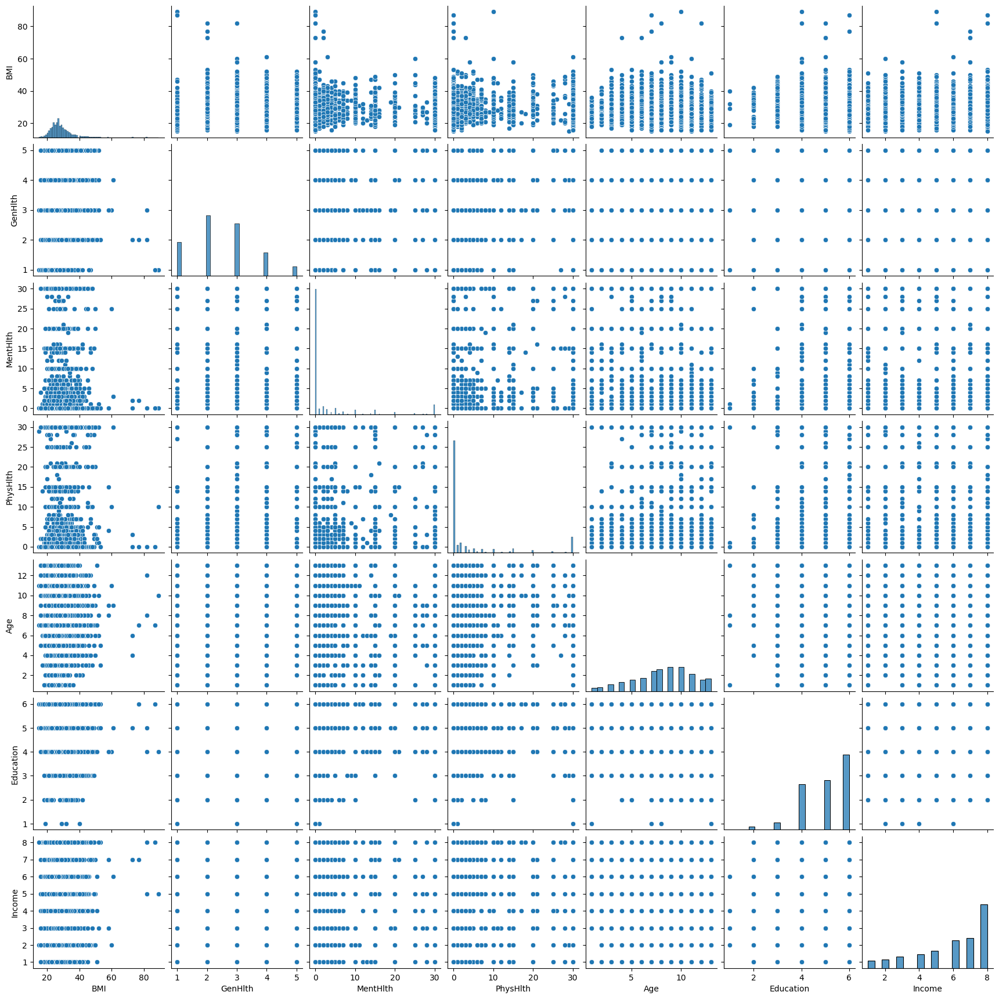

In [ ]:
figout=sns.pairplot(X_num)
plt.show()

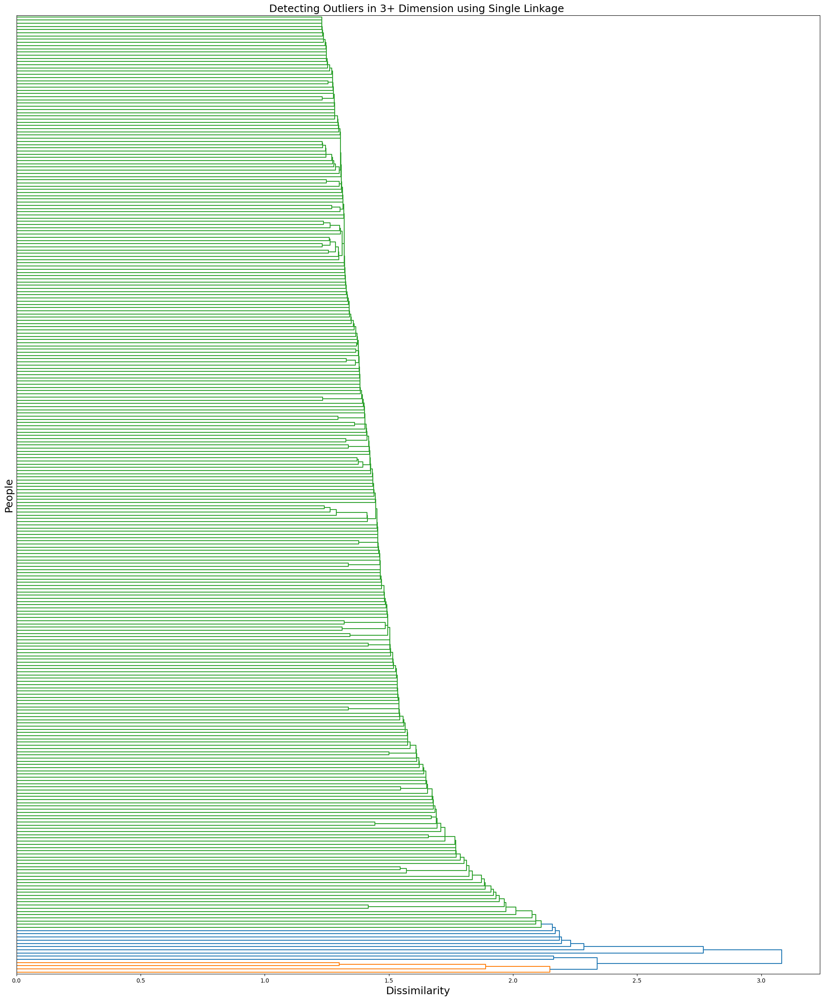

In [ ]:
Z = linkage(X_num_scaled, method='single')
fig, ax = plt.subplots(figsize=(25,30))
d = dendrogram(Z, orientation='right', ax=ax, truncate_mode='lastp', p=300, no_labels=True)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('People', fontsize=18)

plt.yticks(fontsize=12)
plt.title('Detecting Outliers in 3+ Dimension using Single Linkage ', fontsize=18)
plt.show()

In [ ]:
clusters = fcluster(Z, t=2.5, criterion='distance')
cluster_counts = pd.Series(clusters).value_counts()
print(cluster_counts)

2    2992
1       7
3       1
Name: count, dtype: int64


In [ ]:
df_sample['single_link_cluster'] = clusters
singleton_clusters = cluster_counts[cluster_counts == 1].index
outliers = df_sample[df_sample['single_link_cluster'].isin(singleton_clusters)]
outliers[numerical_cols]

,BMI,GenHlth,MentHlth,PhysHlth,Age,Education,Income
1613,60.0,3.0,25.0,10.0,11.0,4.0,2.0


### 3.3 Noise Consideration


&emsp;From our KNN distance plot with K=2, we can see a more gradual increase in neighbor distance, with roughly 500 observations having a distance greather than 1. Because we do not see just a few observations at the end of the plot that produces a large NN distance jump, it suggests that our dataset does have some noise to it.


&emsp;In the context of our project, we do not think we should remove the noisy points. Since our goal is to identify groups of people with different diabetes risk profiles, noisy observations still represent real people with uncommon combinations of medical and lifestyle factors. Removing all noise could eliminate meaningful cases that may help reveal less common but important diabetes risk related patterns. Because of this, we would generally want to use clustering algorithms that are more robust to noise.


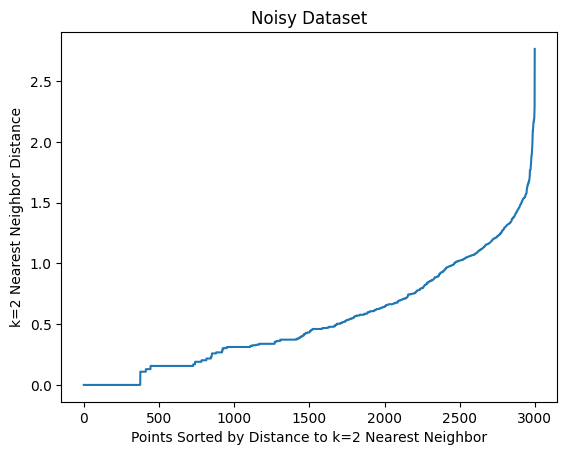

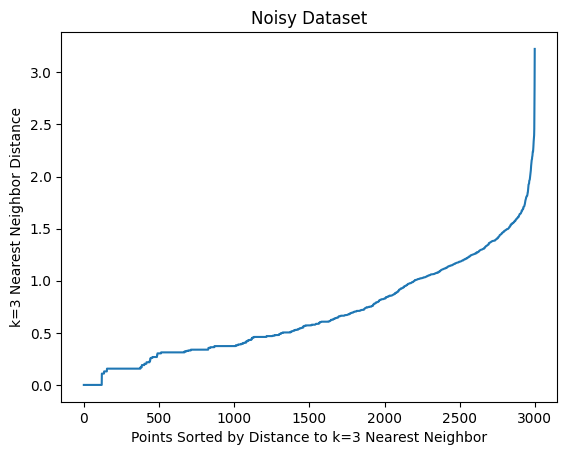

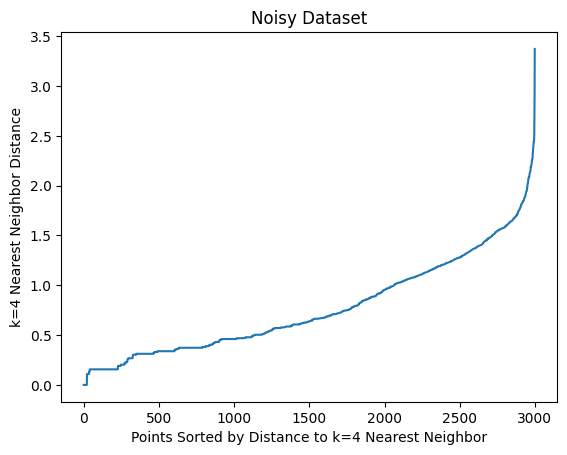

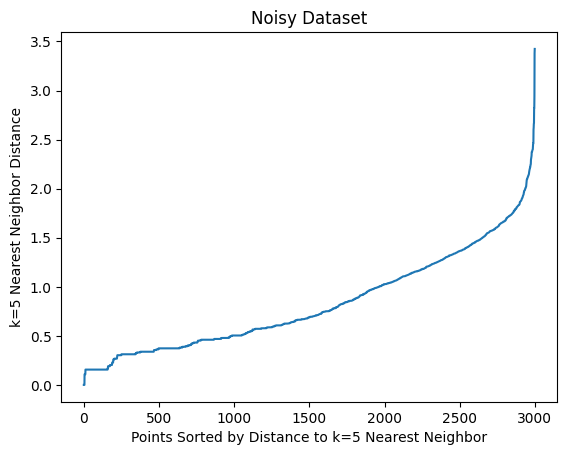

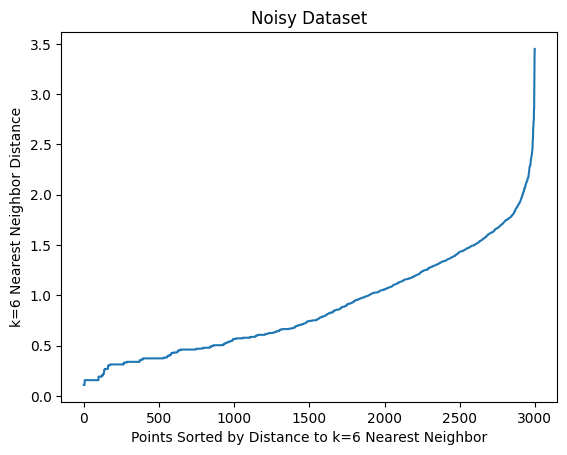

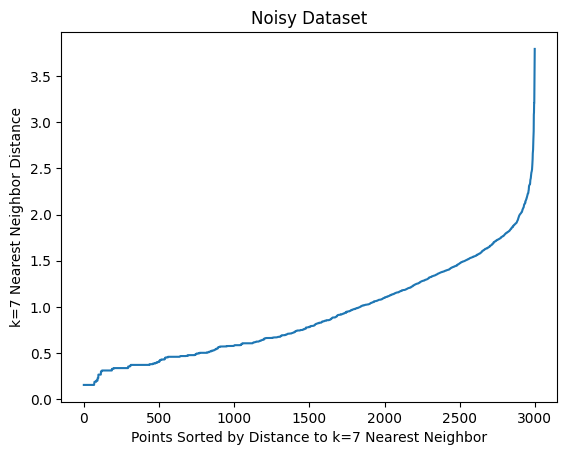

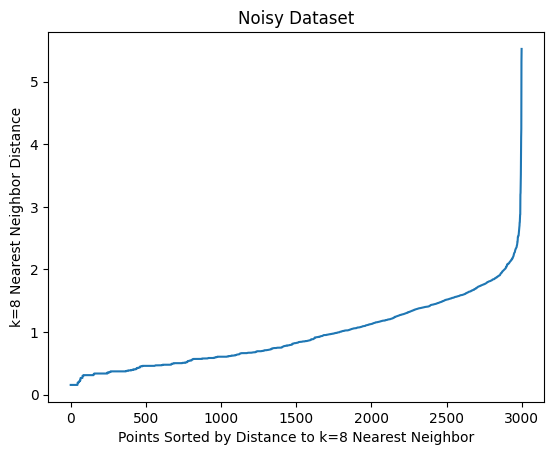

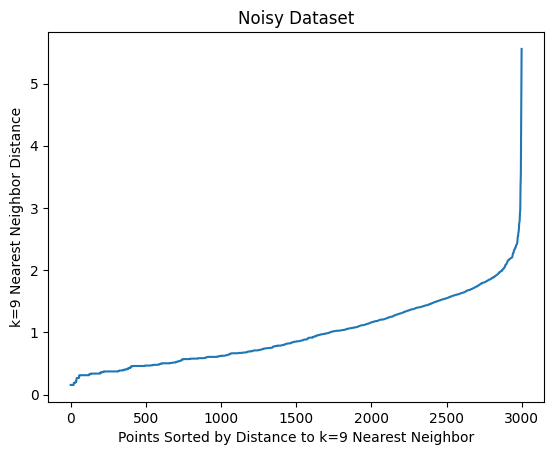

In [ ]:
for k in range(2,10):
    nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(X_num_scaled)
    distances, indices = nbrs.kneighbors(X_num_scaled)

    plt.plot(np.sort(distances.T[k-1]))
    plt.xlabel('Points Sorted by Distance to k=%s Nearest Neighbor'%k)
    plt.ylabel('k=%s Nearest Neighbor Distance'%k)
    plt.title('Noisy Dataset')
    plt.show()

## 4. Basic Descriptive Analytics

&emsp;There are a few moderate relationships, but no extremely strong pairwise relationships. (General Health and Physical Health (r ≈ 0.52), Education and Income (r ≈ 0.45).)

In [ ]:
X_num.describe()

,BMI,GenHlth,MentHlth,PhysHlth,Age,Education,Income
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,28.269000,2.516667,3.342000,4.614667,8.202333,5.033333,6.035000
std,6.403565,1.093978,7.711605,9.194330,2.956063,0.993924,2.088675
min,15.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,24.000000,2.000000,0.000000,0.000000,6.000000,4.000000,5.000000
50%,27.000000,2.000000,0.000000,0.000000,8.500000,5.000000,7.000000
75%,31.000000,3.000000,2.000000,3.000000,10.000000,6.000000,8.000000
max,89.000000,5.000000,30.000000,30.000000,13.000000,6.000000,8.000000


In [ ]:
X_num_scaled.describe()

,BMI,GenHlth,MentHlth,PhysHlth,Age,Education,Income
count,3.000000e+03,3.000000e+03,3.000000e+03,3.000000e+03,3.000000e+03,3.000000e+03,3.000000e+03
mean,2.557954e-16,5.210647e-17,-2.131628e-17,1.302662e-17,-9.947598e-17,1.184238e-16,-6.750156e-17
std,1.000167e+00,1.000167e+00,1.000167e+00,1.000167e+00,1.000167e+00,1.000167e+00,1.000167e+00
min,-2.072473e+00,-1.386609e+00,-4.334450e-01,-5.019872e-01,-2.436868e+00,-4.058666e+00,-2.411021e+00
25%,-6.667711e-01,-4.723612e-01,-4.334450e-01,-5.019872e-01,-7.451467e-01,-1.039824e+00,-4.956121e-01
50%,-1.982039e-01,-4.723612e-01,-4.334450e-01,-5.019872e-01,1.007138e-01,-3.354270e-02,4.620925e-01
75%,4.265523e-01,4.418863e-01,-1.740524e-01,-1.756448e-01,6.082301e-01,9.727382e-01,9.409447e-01
max,9.485517e+00,2.270381e+00,3.457444e+00,2.761437e+00,1.623263e+00,9.727382e-01,9.409447e-01


In [ ]:
corr_matrix = X_num.corr()
corr_matrix

,BMI,GenHlth,MentHlth,PhysHlth,Age,Education,Income
BMI,1.000000,0.200106,0.056774,0.105323,-0.014978,-0.123268,-0.084595
GenHlth,0.200106,1.000000,0.302598,0.546633,0.164088,-0.268228,-0.373325
MentHlth,0.056774,0.302598,1.000000,0.386353,-0.102181,-0.097457,-0.219851
PhysHlth,0.105323,0.546633,0.386353,1.000000,0.107728,-0.148231,-0.283535
Age,-0.014978,0.164088,-0.102181,0.107728,1.000000,-0.103643,-0.148583
Education,-0.123268,-0.268228,-0.097457,-0.148231,-0.103643,1.000000,0.424117
Income,-0.084595,-0.373325,-0.219851,-0.283535,-0.148583,0.424117,1.000000


In [ ]:
X_cat.describe()

,HighBP,HighChol,CholCheck,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,DiffWalk,Sex
count,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0,3000.0
unique,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
top,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0
freq,1745.0,1720.0,2891.0,1613.0,2868.0,2728.0,2266.0,1952.0,2444.0,2836.0,2850.0,2753.0,2462.0,1691.0


In [ ]:
df_sample['Diabetes_012'].value_counts()

,count
Diabetes_012,
0.0,2525
2.0,420
1.0,55


In [ ]:
categorical_selected_cols = ['HighBP', 'HighChol', 'Smoker', 'PhysActivity', 'DiffWalk', 'Sex']

X_cat = df_sample[categorical_selected_cols]
X_cat = X_cat.astype(object)

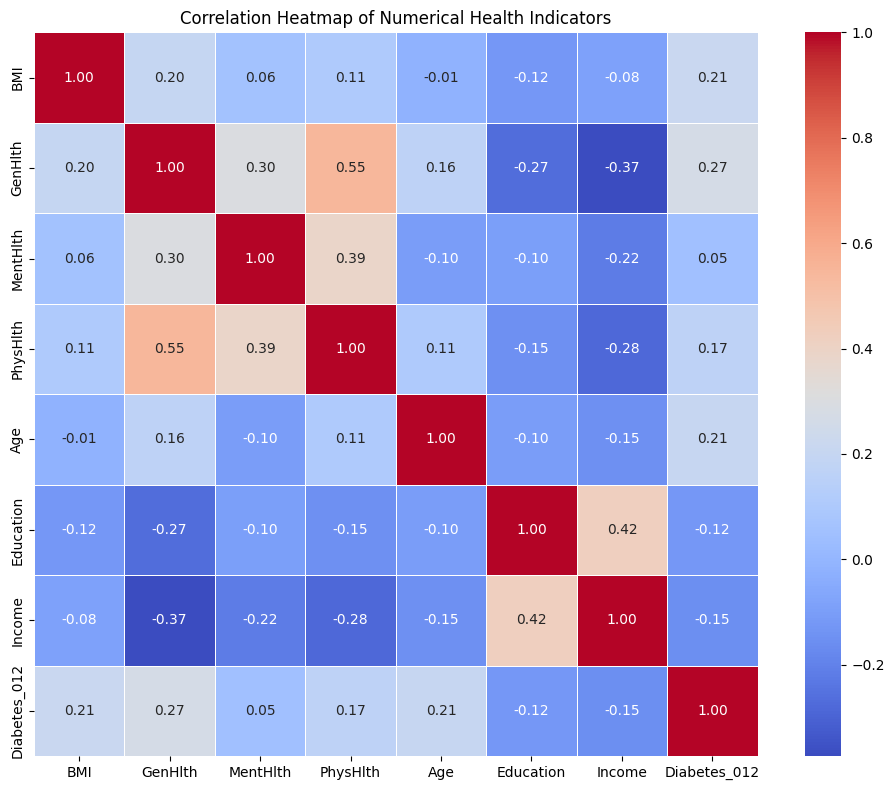

In [ ]:
numerical_cols_for_heatmap = [
    'BMI',
    'GenHlth',
    'MentHlth',
    'PhysHlth',
    'Age',
    'Education',
    'Income',
    'Diabetes_012'
]

corr_matrix = df_sample[numerical_cols_for_heatmap].corr()

plt.figure(figsize=(10,8))

sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    square=True,
    linewidths=0.5
)

plt.title("Correlation Heatmap of Numerical Health Indicators")
plt.tight_layout()
plt.show()

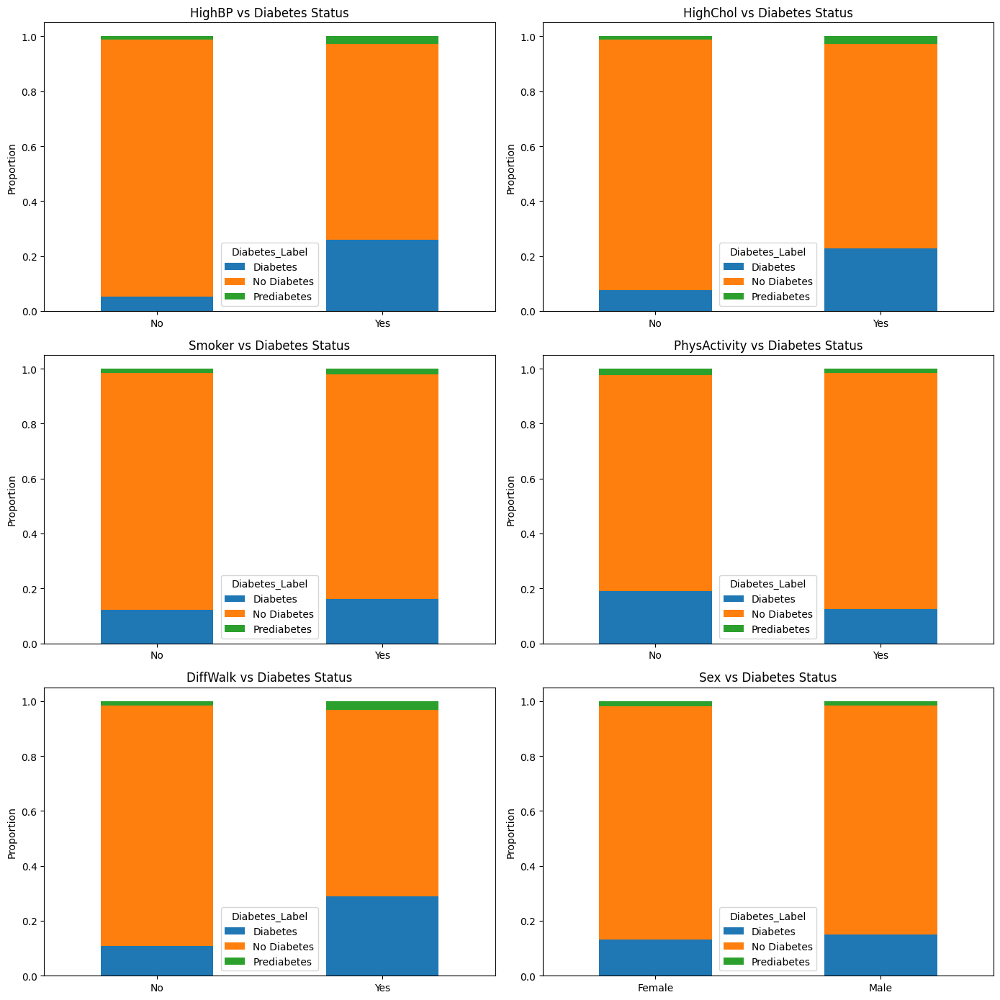

In [ ]:
categorical_selected_cols = [
    'HighBP',
    'HighChol',
    'Smoker',
    'PhysActivity',
    'DiffWalk',
    'Sex'
]

label_mappings = {
    'HighBP': ['No', 'Yes'],
    'HighChol': ['No', 'Yes'],
    'Smoker': ['No', 'Yes'],
    'PhysActivity': ['No', 'Yes'],
    'DiffWalk': ['No', 'Yes'],
    'Sex': ['Female', 'Male']
}

df_plot = df_sample.copy()

df_plot['Diabetes_Label'] = df_plot['Diabetes_012'].map({
    0: 'No Diabetes',
    1: 'Prediabetes',
    2: 'Diabetes'
})

fig, axes = plt.subplots(3, 2, figsize=(14, 14))

axes = axes.flatten()

for i, col in enumerate(categorical_selected_cols):
    ct = pd.crosstab(
        df_plot[col],
        df_plot['Diabetes_Label'],
        normalize='index'
    )

    ct = ct.reindex([0, 1])

    ct.plot(
        kind='bar',
        stacked=True,
        ax=axes[i]
    )

    axes[i].set_xticklabels(label_mappings[col], rotation=0)

    axes[i].set_title(f'{col} vs Diabetes Status')
    axes[i].set_ylabel('Proportion')
    axes[i].set_xlabel('')

plt.tight_layout()
plt.show()

## 5. Scaling Decisions

&emsp;We decided to scale the numerical variables in our dataset because the standard deviations of our variabled varied and we do not want certain columns dominating our clustering structure because of their scale. We completed this step in part 3 for the purposes of finding outliers and noise.

In [ ]:
X_scaled = pd.concat([X_num_scaled, X_cat], axis=1)
X_scaled.head()

,BMI,GenHlth,MentHlth,PhysHlth,Age,Education,Income,HighBP,HighChol,Smoker,PhysActivity,DiffWalk,Sex
0,-1.447716,0.441886,-0.433445,-0.501987,-0.068458,0.972738,-0.495612,1.0,0.0,1.0,1.0,1.0,0.0
1,-0.822960,0.441886,-0.433445,-0.284426,-2.098524,0.972738,-0.974464,1.0,0.0,0.0,1.0,0.0,1.0
2,-0.042015,-0.472361,-0.433445,-0.501987,0.269886,0.972738,0.940945,1.0,1.0,0.0,1.0,0.0,0.0
3,-0.666771,-0.472361,-0.433445,-0.501987,1.623263,-0.033543,-0.016760,1.0,1.0,1.0,1.0,0.0,1.0
4,2.300821,1.356134,0.215036,2.217533,0.269886,-0.033543,-1.453317,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df_sample_scaled = X_scaled.copy()
df_sample_scaled['Diabetes_012'] = df_sample['Diabetes_012']

## 6. Clusterability and Clustering Structure

### 6.1 t-SNE Plots and Cluster Structure: explore using Gower's Distance

&emsp;From our t-SNE plots, it is suggested that our dataset is clusterable. From our chosen perplexity value (50) and random state (100), our plot is suggesting approximately 5 clusters. We believe that there are 4 clusters on each edge of the 4 box lines, and one larger cluster in the middle that appears to have many subclusters. Our clusters seem to be mostly spherical in shape, however they are not balanced in size. The middle large cluster has a lot more observations than the other 4 clusters. The clusters appear to be decently well separated however there does appear to be some gaps between our inherent clusters that are smaller than some gaps within our large inherent cluster. Our large inherent cluster seems to have many nested clusters.

&emsp;It is important to know that with t-SNE plots, we should not interpret outliers, cluster sparsity, distance between clusters, and the location of our projected x and y coordinates do not mean anything by themselves.


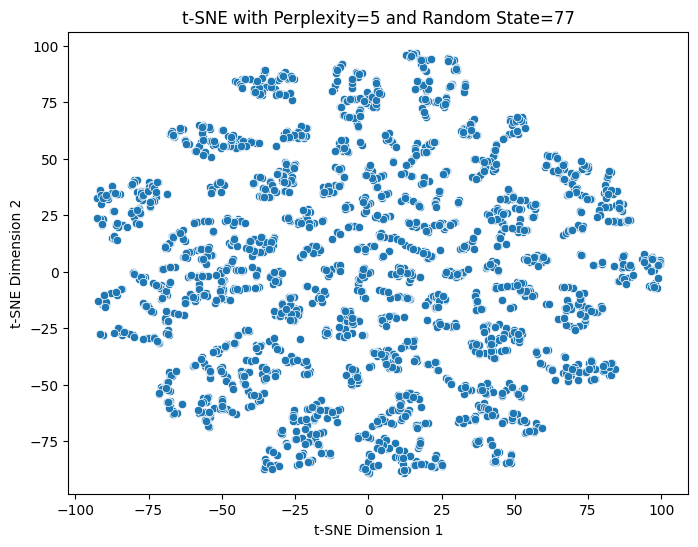

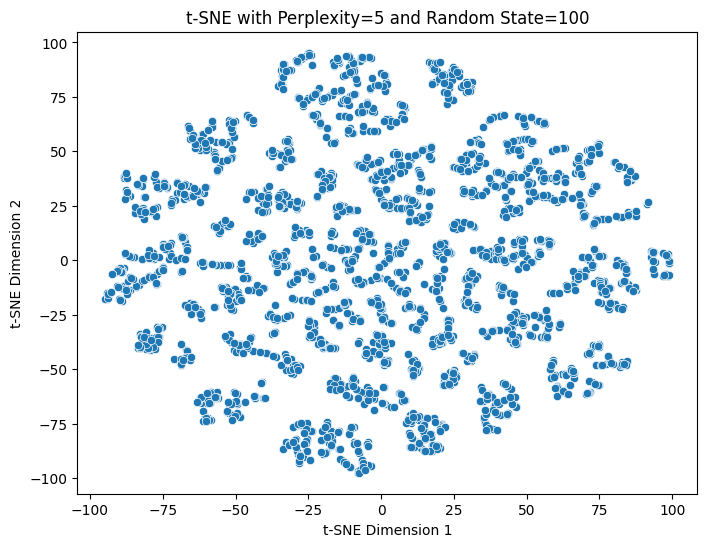

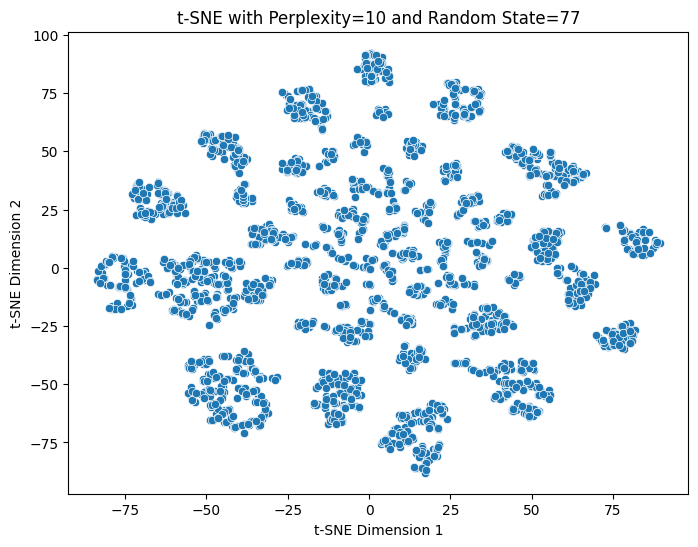

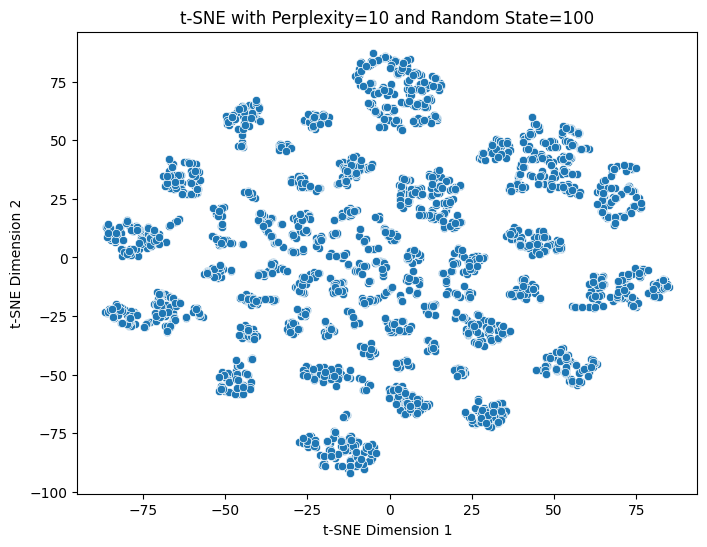

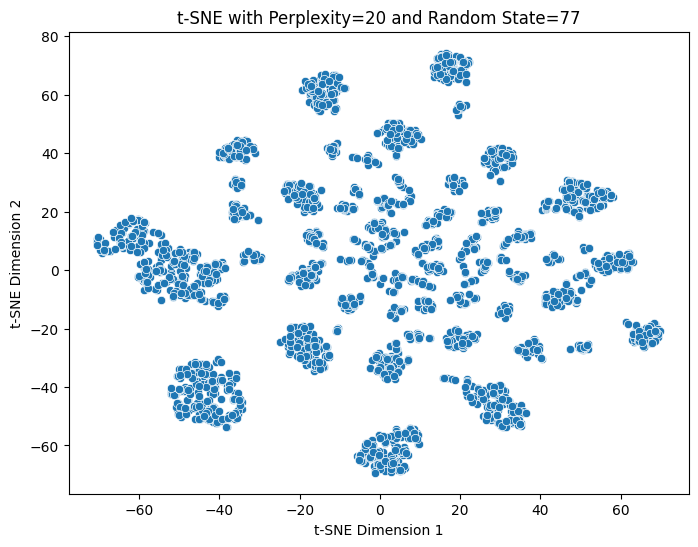

...

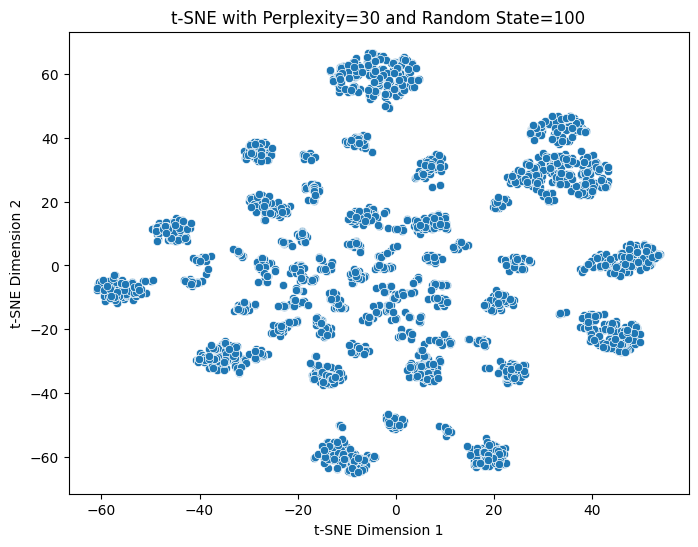

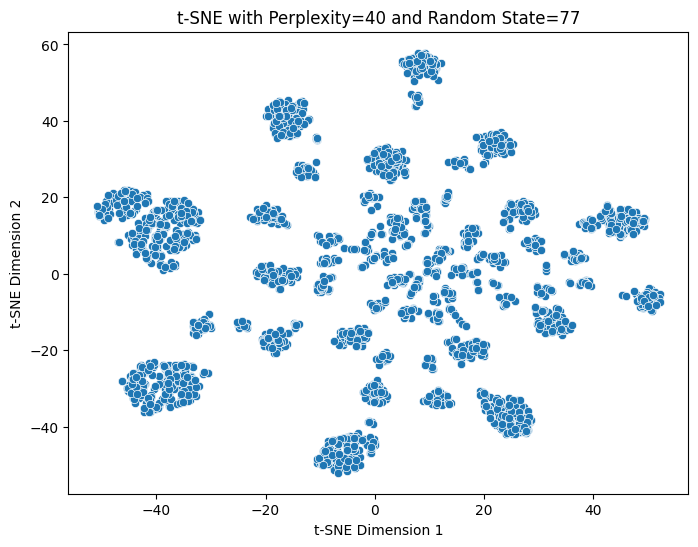

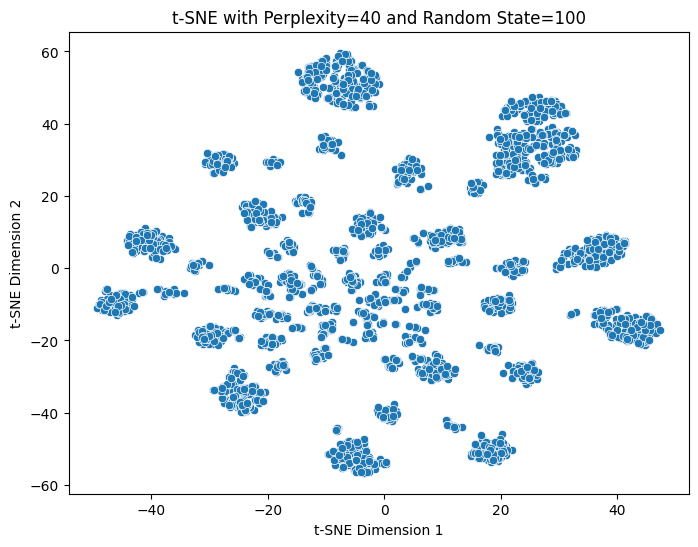

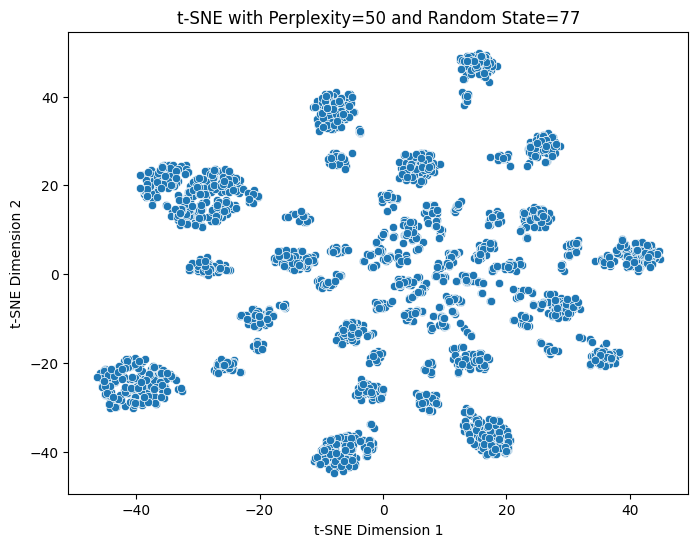

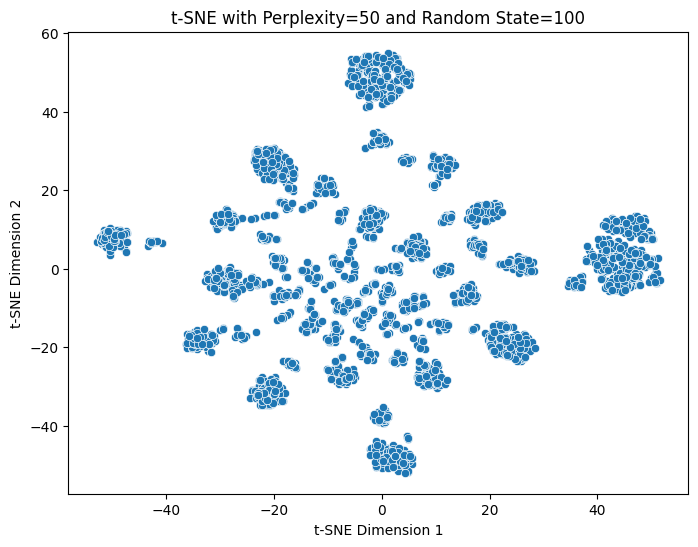

In [ ]:
dist_mat = gower_matrix(X_scaled)
for perp in [5, 10, 20, 30, 40, 50]:
    for rs in [77, 100]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs, metric='precomputed', init='random')
        X_tsne = tsne.fit_transform(dist_mat)
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1])
        plt.title(f't-SNE with Perplexity={perp} and Random State={rs}')
        plt.xlabel('t-SNE Dimension 1')
        plt.ylabel('t-SNE Dimension 2')
        plt.show()

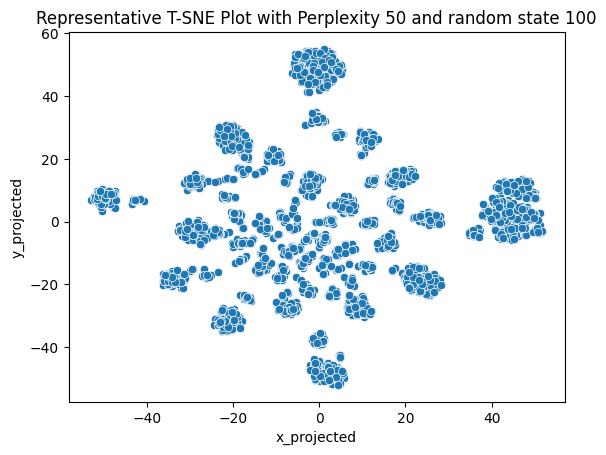

In [ ]:
# display the most representative t-SNA plot
for perp in [50]:
    for rs in [100]:
        tsne = TSNE(n_components = 2, perplexity = perp, random_state = rs, metric = 'precomputed', init = 'random')
        data_tsne = tsne.fit_transform(dist_mat)
        sample_tsne = pd.DataFrame(data_tsne, columns = ['x_projected', 'y_projected'])
        sample_combo = pd.concat([df_sample_scaled, sample_tsne], axis = 1)
        sns.scatterplot(x = 'x_projected', y = 'y_projected', data = sample_combo)
        plt.title('Representative T-SNE Plot with Perplexity %s and random state %s' %(perp, rs))
        plt.show()

### 6.2 Clustering Structure and Attribute Association

&emsp;From our t-SNE plots color coded with our Y variable and our explanatory variables, we observe some patterns that are associated with our t-SNE plots. Firsly, a majority of the people who have been diagnosed with Diabetes sit in our large middle inherent cluster. While not completely exclusive, we can see most of the people with diagnosed diabetes are in that cluster.

&emsp; For some of our categorical variables, we can see that for people with physical activity = 0, they are all part of the large inherent cluster in the middle. We can also see that the people who have difficulty walking are mostly part of the large inherent cluster. The other categorical variables appear to be split.

&emsp; For numerical variables, we can see that for PhysHlth and MentHlth, a value of 0 indicates that a person has not had problems with them in the past 30 days of being surveyed. We can see that most of the values that are above 1 are within the large inherent middle cluster. Also in GenHlth, where a higher number represents lower health, we can see the higher numbers are more within the large middle cluster. The other variables appear to be more split.

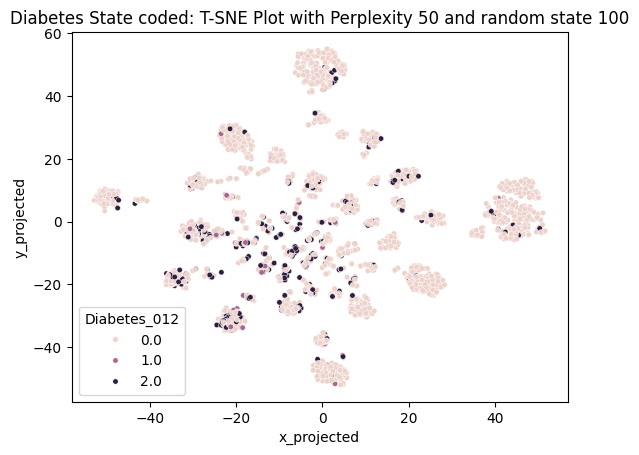

In [ ]:
sns.scatterplot(x = 'x_projected', y = 'y_projected', hue = 'Diabetes_012', data = sample_combo, s=15)
plt.title('Diabetes State coded: T-SNE Plot with Perplexity %s and random state %s' %(perp, rs))
plt.legend(
    title='Diabetes_012',
    loc='lower left'
)
plt.show()

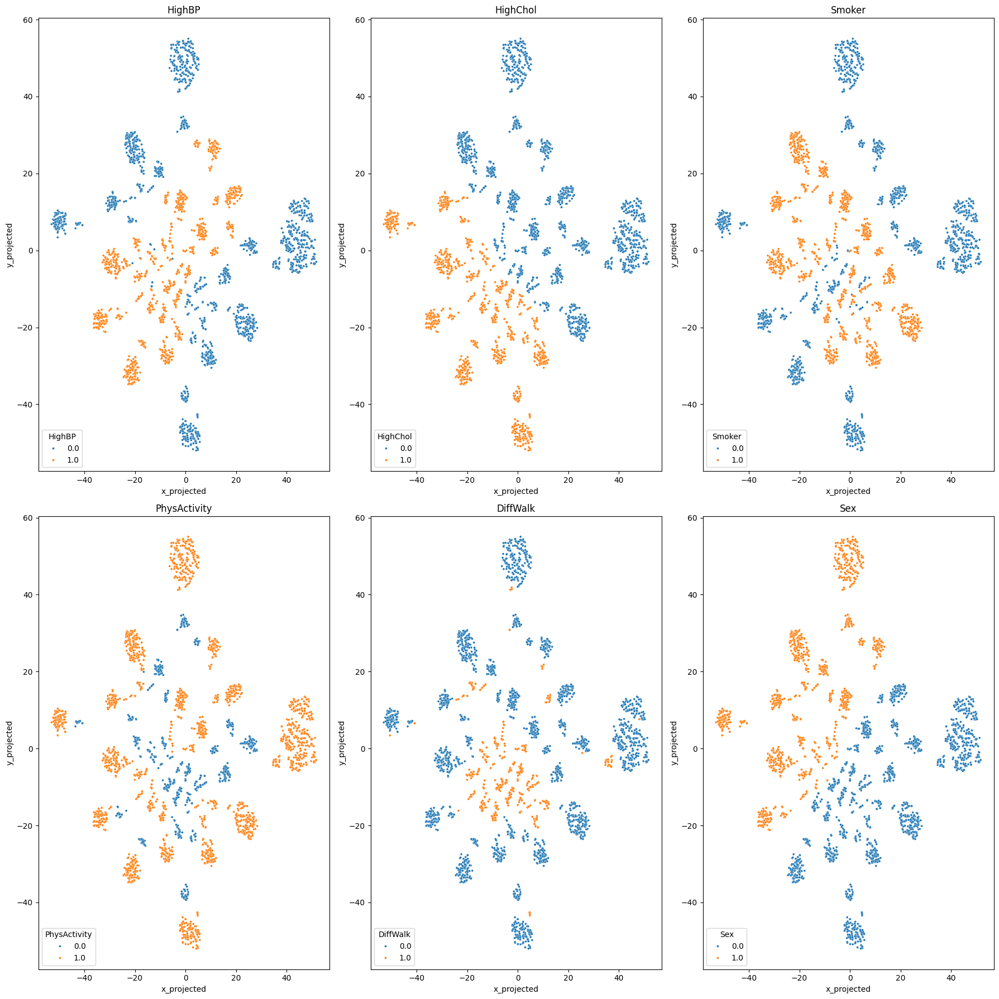

In [ ]:
fig, axes = plt.subplots(2, 3, figsize=(18, 18))

axes = axes.flatten()

for i, col in enumerate(categorical_selected_cols):

    sns.scatterplot(
        x='x_projected',
        y='y_projected',
        hue=col,
        data=sample_combo,
        ax=axes[i],
        s=8
    )

    axes[i].set_title(f'{col}')

    axes[i].legend(
        title=col,
        loc='lower left'
    )

plt.tight_layout()
plt.show()


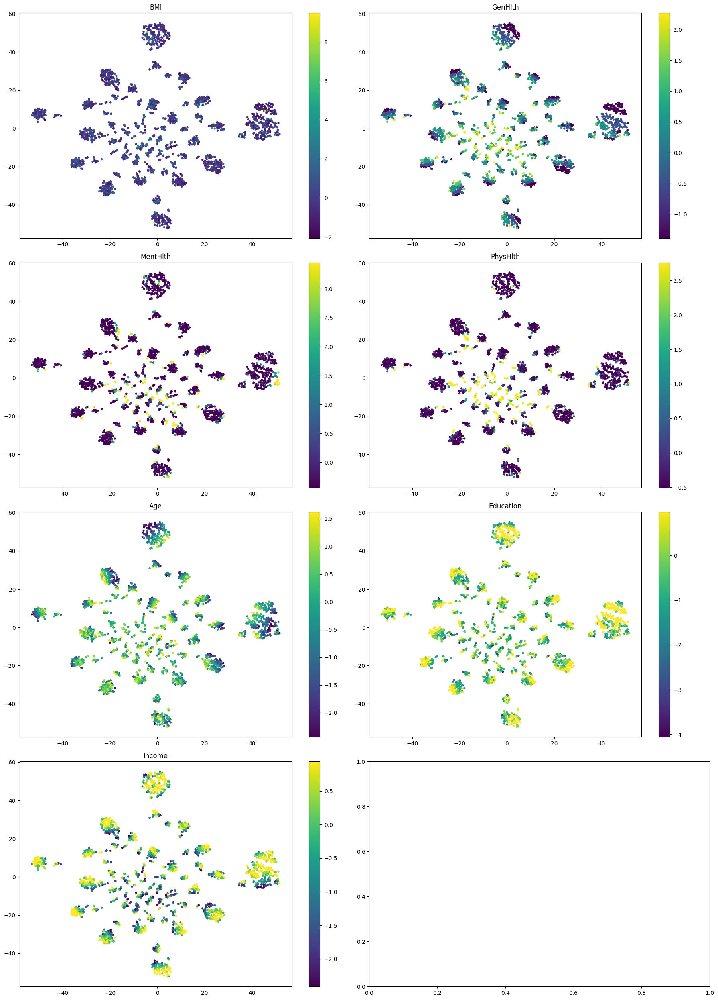

In [ ]:
fig, axes = plt.subplots(4, 2, figsize=(18, 25))

axes = axes.flatten()

for i, col in enumerate(numerical_cols):

    scatter = axes[i].scatter(
        sample_combo['x_projected'],
        sample_combo['y_projected'],
        c=sample_combo[col],
        cmap='viridis',
        s=8
    )

    axes[i].set_title(col)

    plt.colorbar(scatter, ax=axes[i])

plt.tight_layout()
plt.show()

## 7. Clustering Algorithm Selection Motivation

For our dataset with both categorical and numerical variables, we decided to use a weighted combination of Euclidean and Hamming Distance as we wanted to parameter tune for how much our categorical and numerical variables contribute to our clustering structure.

Weighted Euclidean and Hamming Distance:
$$
d(x_{ij},x_{i'j}) = \sum_{j = 1}^{p} (x_{ij} - x_{i'j})^2 + \gamma \sum_{j = p+1}^{n} \delta(x_{ij}, x_{i'j})
$$
where
$$
\delta(x_{ij}, x_{i'j}) =
\begin{cases}
0, & x_{ij}=x_{i'j} \\
1, & x_{ij}\neq x_{i'j}
\end{cases}
$$

### 7.1 Cluster Algorithm 1: K-prototype

&emsp;We chose to use the K-Prototypes clustering algorithm because our dataset consists of both numerical variables (BMI, age, etc) and categorical variables (High Blood Pressure, Any Health Care, etc). K-Prototypes is a mixed version of K-Means so it fits our data type. Secondly, K-Prototypes is very computationally efficient. Our dataset is very large, containing over 250,000 observations, so we had to sample for our project. However even with sampling it is still moderately large so we wanted to choose a algorithm that can scale well with large datasets. We also want to identify distinct groups of people who may be at higher risk for diabetes, so we want hard partition clustering which K-Prototypes does. Lastly, it allows us to control the relative weighting between numerical and categorical variables through its gamma parameter.

### 7.2 Cluter Algorithm 2: HAC with complete linkage, using weighted squared Euclidean + Hamming distance metric

&emsp;We also chose to use HAC with average linkage because it fits our data type. Hierarchical Clustering Algorithms can be generalized to cluster datasets of mixed variable types. We decided to use average linkage because our data does have outliers, suggested by our pairplots, single linkage dendrogram, and KNN distance plots. It is less sensitive to outliers compared to single linkage, which aligns with our research goals of focusing on finding the large inherent clusters. We wanted to choose a safe middle ground between single and complete linkage.

## 8. Clustering Algorithm #1: K-prototype



### 8.1 K-prototype Elbow plot for Gamma tuning

In [ ]:
X_scaled.head()

,BMI,GenHlth,MentHlth,PhysHlth,Age,Education,Income,HighBP,HighChol,Smoker,PhysActivity,DiffWalk,Sex
0,-1.447716,0.441886,-0.433445,-0.501987,-0.068458,0.972738,-0.495612,1.0,0.0,1.0,1.0,1.0,0.0
1,-0.822960,0.441886,-0.433445,-0.284426,-2.098524,0.972738,-0.974464,1.0,0.0,0.0,1.0,0.0,1.0
2,-0.042015,-0.472361,-0.433445,-0.501987,0.269886,0.972738,0.940945,1.0,1.0,0.0,1.0,0.0,0.0
3,-0.666771,-0.472361,-0.433445,-0.501987,1.623263,-0.033543,-0.016760,1.0,1.0,1.0,1.0,0.0,1.0
4,2.300821,1.356134,0.215036,2.217533,0.269886,-0.033543,-1.453317,0.0,0.0,0.0,0.0,0.0,0.0


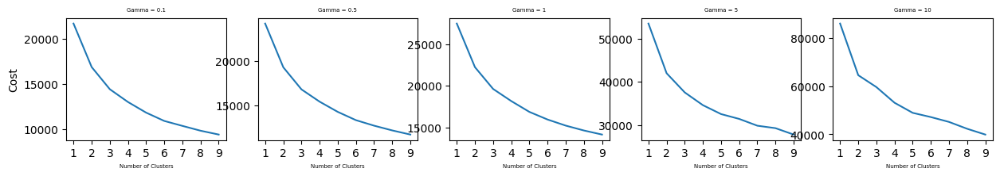

In [ ]:
gamma_values = [0.1, 0.5, 1, 5, 10]
k_values = range(1, 10)
all_costs = {}

for gamma in gamma_values:
    cost = []
    for k in k_values:
        kp = KPrototypes(n_clusters = k, gamma = gamma, random_state = 100)
        kp.fit_predict(X_scaled, categorical = list(range(7, 13)))
        cost.append(kp.cost_)
    all_costs[gamma] = cost

fig, ax = plt.subplots(1, len(gamma_values), figsize = (15, 2))

for i in range(len(gamma_values)):
    gamma = gamma_values[i]
    ax[i].plot(k_values, all_costs[gamma])
    ax[i].set_title(f'Gamma = {gamma}', fontsize = 5)
    ax[i].set_xlabel('Number of Clusters', fontsize = 5)
    ax[i].set_xticks(list(k_values))
    ax[i].grid(False)
ax[0].set_ylabel('Cost')

plt.show()

Since our dataset contains both categorical and numerical variables, we chose to use a weighted Euclidean and Hamming distance metric in order to be more flexible with the weight of the categorical variables.

This distance metric requires parameter tuning for gamma. To select the best gamma value, we tested five gamma candidates, ranging from 0.1 to 10. This means that we tried different weights placed on the categorical variables. For each gamma value, we ran the K-Prototypes algorithm for k = 2 to k = 9 clusters, and we put the five elbow plots together for comparison.

We observed that when gamma was small, we could hardly observe any elbows, while when gamma increased to 10, we could observe an elbow. Therefore, the elbow plots suggest that when gamma = 10, K-Prototypes is more likely to identify some clustering structure.

The elbow in the gamma = 10 elbow plot occurs at k = 5. Therefore, the elbow plot method suggests that the best gamma value is 10 and the best k value, or number of clusters, is 5.

### 8.2 Exploring Gamma = 10

We decided to explore a gamma value of 10 as it showed the strongest sharpest turns in our elbow plots.

In [ ]:
num_dist = squareform(pdist(X_num_scaled, 'euclidean'))**2

sample_categorical_code = X_cat.copy()
label_enc = {}
for col in sample_categorical_code.columns:
    label_enc[col] = preprocessing.LabelEncoder()
    sample_categorical_code[col] = label_enc[col].fit_transform(X_cat[col])
cat_dist = squareform(pdist(sample_categorical_code, 'hamming'))

gamma = 10
dist_gamma_10 = num_dist + gamma*cat_dist
dist_gamma_10

array([[ 0.        ,  9.78811764,  9.99001765, ..., 22.13500188,
        14.3575108 , 12.43041977],
       [ 9.78811764,  0.        , 14.10454579, ..., 17.29790471,
        21.93944449, 18.40989353],
       [ 9.99001765, 14.10454579,  0.        , ..., 30.57823987,
         7.95065238,  7.66432515],
       ...,
       [22.13500188, 17.29790471, 30.57823987, ...,  0.        ,
        34.98222515, 28.56329231],
       [14.3575108 , 21.93944449,  7.95065238, ..., 34.98222515,
         0.        ,  6.30183832],
       [12.43041977, 18.40989353,  7.66432515, ..., 28.56329231,
         6.30183832,  0.        ]])

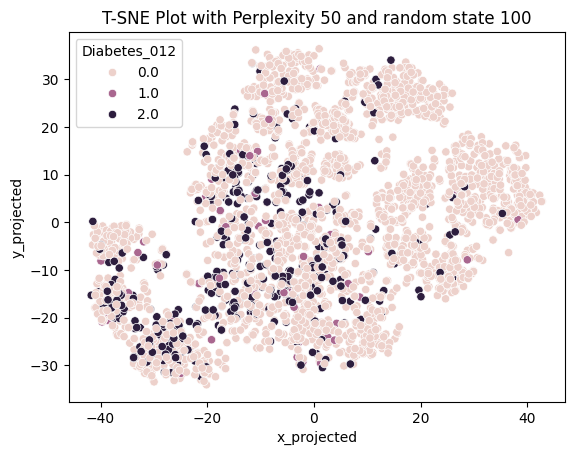

In [ ]:
tsne = TSNE(n_components = 2, perplexity = perp, random_state = rs, metric = 'precomputed', init = 'random')
data_tsne = tsne.fit_transform(dist_gamma_10)
sample_tsne = pd.DataFrame(data_tsne, columns = ['x_projected', 'y_projected'])
sample_with_diabetes_combo = pd.concat([df_sample_scaled, sample_tsne], axis = 1)
sns.scatterplot(x = 'x_projected', y = 'y_projected', data = sample_with_diabetes_combo, hue='Diabetes_012')
plt.title('T-SNE Plot with Perplexity %s and random state %s' %(perp, rs))
plt.show()

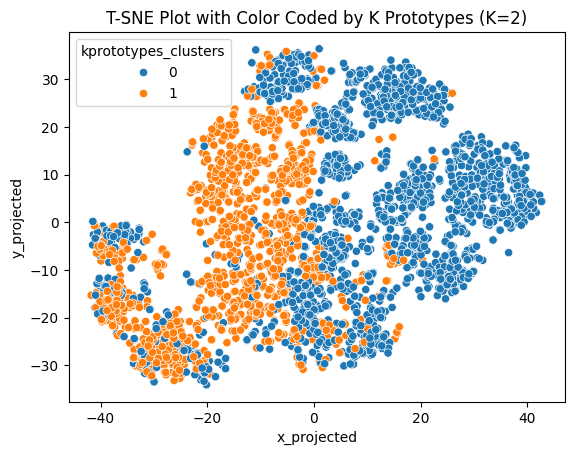

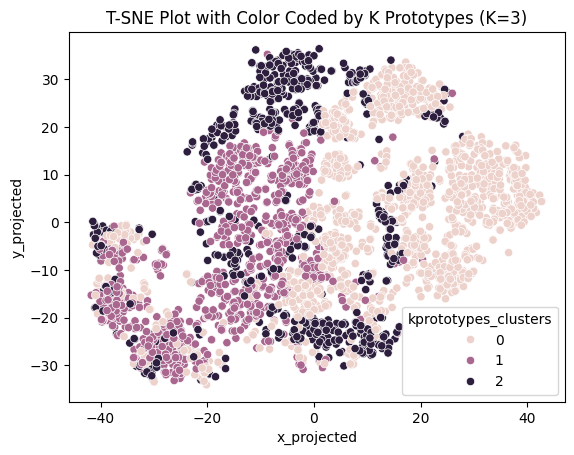

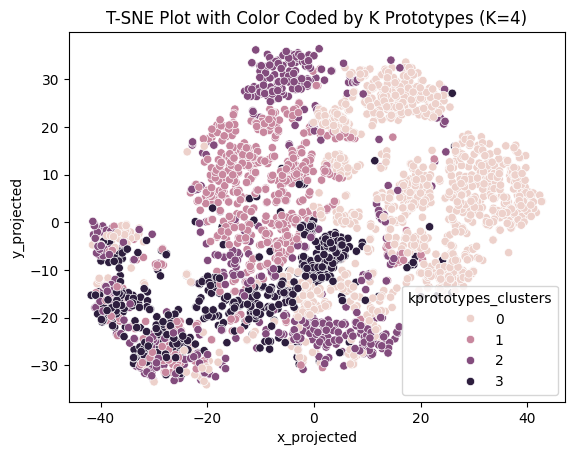

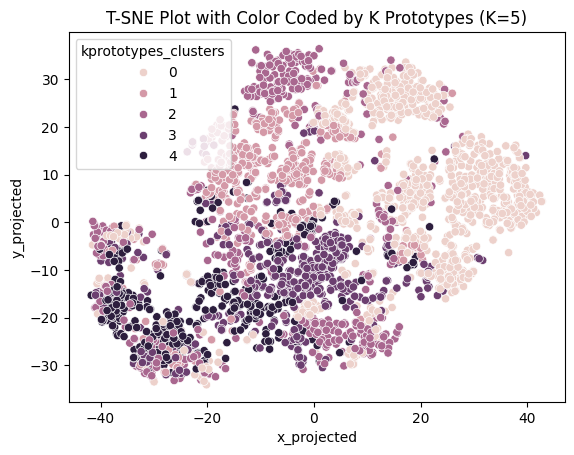

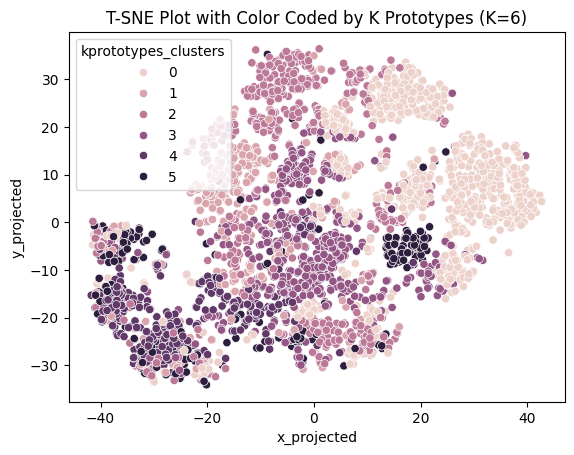

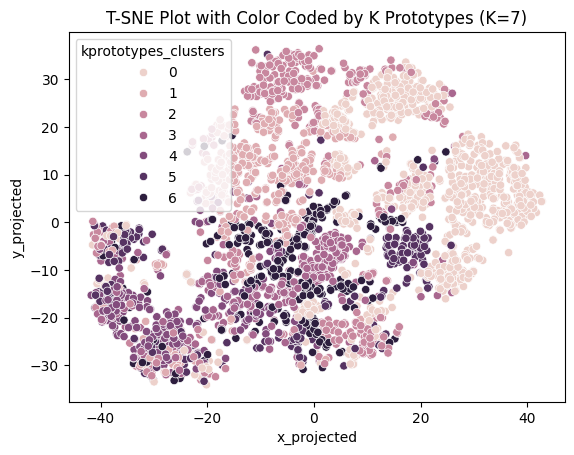

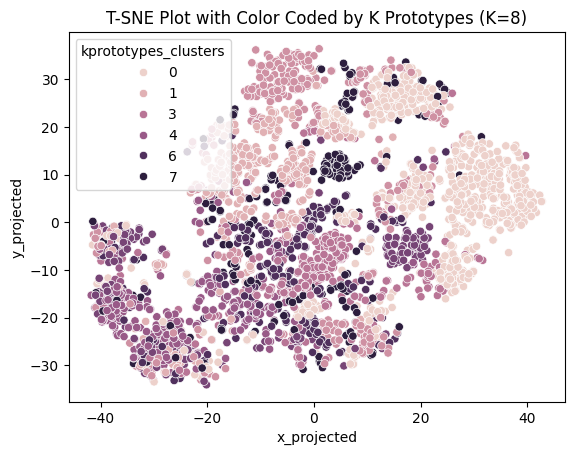

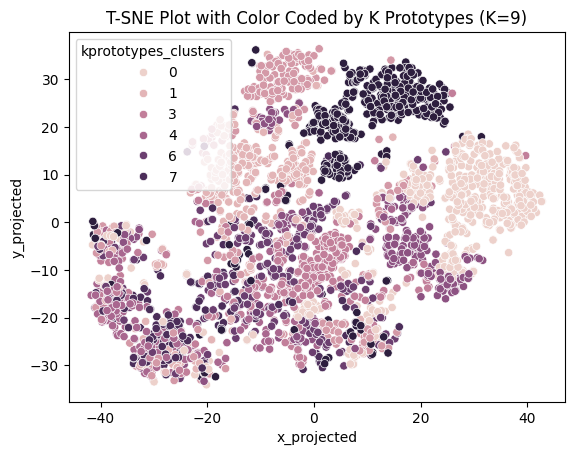

In [ ]:
k_values = range(2, 10)
for k in k_values:
  kp=KPrototypes(n_clusters=k, gamma=10, random_state=100)
  cluster_labels = kp.fit_predict(X_scaled, categorical = list(range(7, 13)))
  sample_with_diabetes_combo['kprototypes_clusters'] = cluster_labels
  sns.scatterplot(x = 'x_projected', y = 'y_projected', data = sample_with_diabetes_combo, hue='kprototypes_clusters')
  plt.title('T-SNE Plot with Color Coded by K Prototypes (K=%s)' %(k))
  plt.show()


We want to use the T-SNE plot method to help select the optimal k value. Therefore, we set our gamma value to 10 and used the weighted Euclidean and Hamming distance matrix with gamma = 10 to plot our T-SNE plot. We first displayed our T-SNE plot color-coded by our original diabetes labels. From the T-SNE plot, we can observe roughly three not well-separated and non-spherical clusters. The clusters have similar sparsity but are imbalanced in size.

Then, we ran the K-Prototypes algorithm from k = 2 to k = 9 clusters. For each iteration, we color-coded our T-SNE plot with the K-Prototypes clustering results to observe both the agreement with the T-SNE-identified clusters and the agreement with the diabetes labels.

We can observe that none of the k values gives an ideal result. We can only observe weak corroborating evidence, since the colors are mixed up in the larger cluster at the center for all k values. Nevertheless, this does not mean that our K-Prototypes algorithm is performing poorly, as we can see that there is some agreement between the K-Prototypes-suggested clusters and the original diabetes labels.

In our T-SNE plot color-coded by diabetes labels, we can see some severe diabetes cases located on the bottom-left side of the T-SNE plot. Similarly, for k = 3, 4, and 5, there are points located in similar spots on the T-SNE plots with the same color. This means that for k = 3, 4, and 5, one of the clusters is likely to identify the clustering structure based on diabetes severity. Based on the above analysis, we have reason to believe that these clusterings are aligned with our research goals.


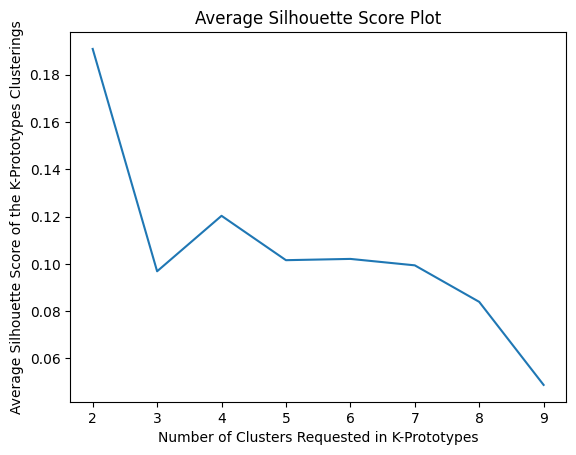

In [ ]:
# Gamma = 10 Average Silhouette Score Plot:
gamma = 10
k_values = list(range(2, 10))
avg_sil_score_list = []

for k in k_values:
  kp = KPrototypes(n_clusters = k, gamma = 10, random_state = 100)
  cluster_labels = kp.fit_predict(X_scaled, categorical = list(range(7, 13)))
  avg_sil_score = silhouette_score(dist_gamma_10, cluster_labels, metric = 'precomputed')
  avg_sil_score_list.append(avg_sil_score)

plt.plot(k_values, avg_sil_score_list)
plt.xlabel('Number of Clusters Requested in K-Prototypes')
plt.ylabel('Average Silhouette Score of the K-Prototypes Clusterings')
plt.title('Average Silhouette Score Plot')
plt.show()

We want to use multiple methods to gain insights into selecting the k value. We also want to try the average silhouette score plot.

We ran the K-Prototypes algorithm for k = 2 to k = 9. For each k value, we calculated the average silhouette score of the output clustering and added this score to an average silhouette score list. After eight iterations, we plotted this list to obtain the average silhouette score plot.

Normally, we would select the clustering result with a higher average silhouette score. In our case, we can observe that k = 2 has the highest average silhouette score, while the clusterings with k = 4 and k = 5 also have relatively high silhouette scores. Therefore, the average silhouette score method suggests that the better k values are 2, 4, and 5. This conclusion also agrees with our previous analysis. Therefore, we have reason to believe that k values of 4 and 5 are more likely to produce the best clustering results that align with our research goals.

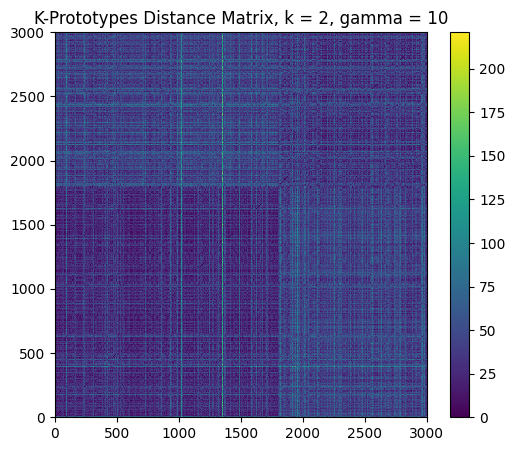

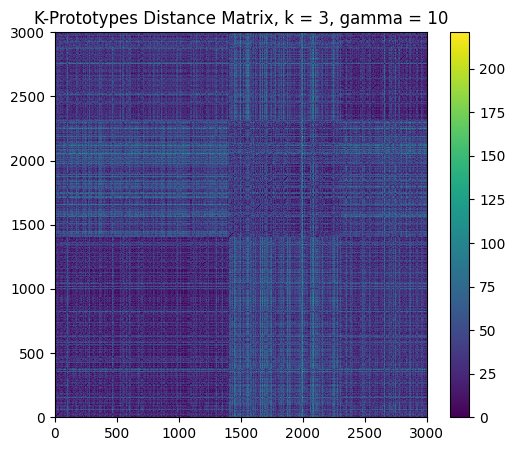

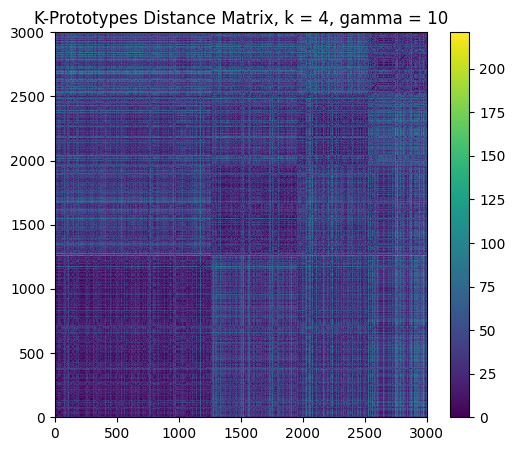

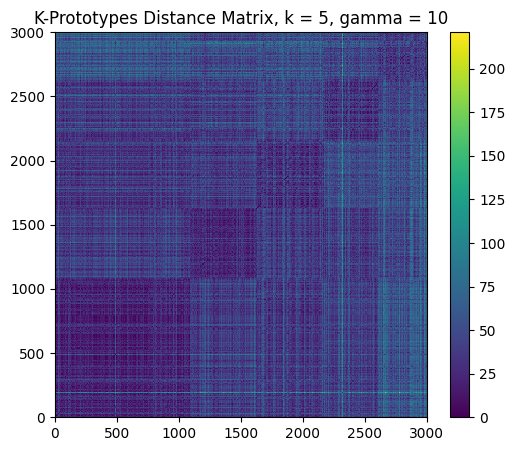

In [ ]:
gamma = 10
k_values = [2, 3, 4, 5]

for k in k_values:
    kp = KPrototypes(n_clusters=k, gamma=gamma, random_state=100)

    cluster_labels = kp.fit_predict(X_scaled,categorical=list(range(7, 13)))
    num_df = X_num_scaled.copy()
    cat_df = X_cat.copy()

    num_df['kprototypes_clusters'] = cluster_labels
    num_sample_sort = num_df.sort_values(by='kprototypes_clusters')
    num_sample_sort = num_sample_sort.drop('kprototypes_clusters', axis=1)

    cat_df['kprototypes_clusters'] = cluster_labels
    cat_sample_sort = cat_df.sort_values(by='kprototypes_clusters')
    cat_sample_sort = cat_sample_sort.drop('kprototypes_clusters', axis=1)

    num_dist = squareform(pdist(num_sample_sort, metric='euclidean')) ** 2

    sample_categorical_code = cat_sample_sort.copy()
    label_enc = {}

    for col in sample_categorical_code.columns:
        label_enc[col] = preprocessing.LabelEncoder()
        sample_categorical_code[col] = label_enc[col].fit_transform(
            sample_categorical_code[col].astype(str)
        )

    cat_dist = squareform(
        pdist(sample_categorical_code.values, metric='hamming')
    ) * sample_categorical_code.shape[1]

    dist_gamma_10 = num_dist + gamma * cat_dist

    plt.figure(figsize=(6, 5))
    plt.pcolormesh(dist_gamma_10)
    plt.colorbar()
    N = len(num_sample_sort)
    plt.xlim([0, N])
    plt.ylim([0, N])
    plt.title(f"K-Prototypes Distance Matrix, k = {k}, gamma = {gamma}")
    plt.show()

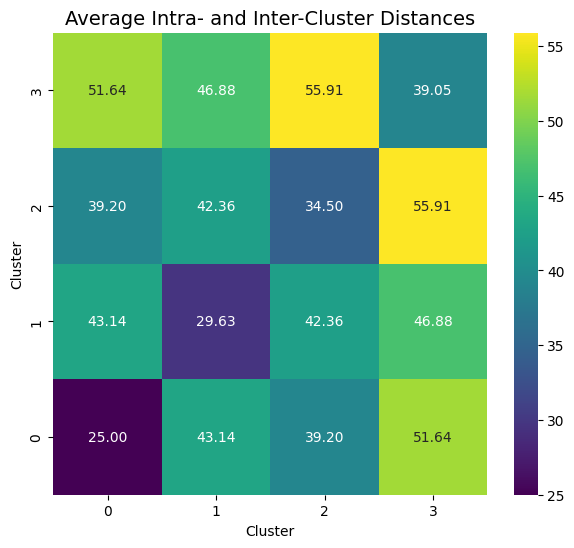

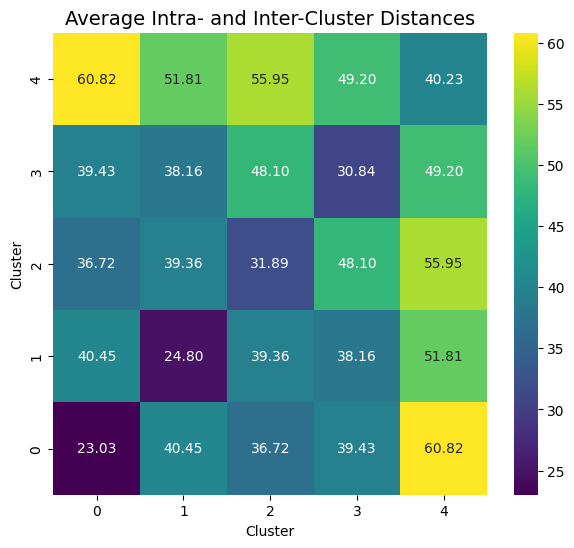

In [ ]:
gamma = 10
k_values = [4, 5]

for k in k_values:
    kp = KPrototypes(n_clusters=k, gamma=gamma, random_state=100)

    cluster_labels = kp.fit_predict(X_scaled,categorical=list(range(7, 13)))
    num_df = X_num_scaled.copy()
    cat_df = X_cat.copy()

    num_df['kprototypes_clusters'] = cluster_labels
    num_sample_sort = num_df.sort_values(by='kprototypes_clusters')
    num_sample_sort = num_sample_sort.drop('kprototypes_clusters', axis=1)

    cat_df['kprototypes_clusters'] = cluster_labels

    end_points = cat_df['kprototypes_clusters'].value_counts().sort_index().cumsum()

    cat_sample_sort = cat_df.sort_values(by='kprototypes_clusters')
    cat_sample_sort = cat_sample_sort.drop('kprototypes_clusters', axis=1)

    avg_dist_mat=np.zeros((len(end_points), len(end_points)))

    num_dist = squareform(pdist(num_sample_sort, metric='euclidean')) ** 2

    sample_categorical_code = cat_sample_sort.copy()
    label_enc = {}

    for col in sample_categorical_code.columns:
        label_enc[col] = preprocessing.LabelEncoder()
        sample_categorical_code[col] = label_enc[col].fit_transform(
            sample_categorical_code[col].astype(str)
        )

    cat_dist = squareform(
        pdist(sample_categorical_code.values, metric='hamming')
    ) * sample_categorical_code.shape[1]

    dist_gamma_10_sorted = num_dist + gamma * cat_dist


    for i in range(0,len(end_points)):
        for j in range(0,len(end_points)):
            #Start points and end points of block
            start_i = 0 if i == 0 else end_points[i-1]
            start_j = 0 if j == 0 else end_points[j-1]
            end_i = end_points[i]
            end_j = end_points[j]

            #Block mean distance
            block = dist_gamma_10_sorted[start_i:end_i, start_j:end_j]
            avg_dist_mat[i, j] = block.mean()

    avg_dist_df = pd.DataFrame(avg_dist_mat, index=range(0,len(end_points)), columns=range(0,len(end_points)))


    avg_dist_df_flipped = avg_dist_df.iloc[::-1]


    plt.figure(figsize=(7,6))
    sns.heatmap(avg_dist_df_flipped, annot=True, fmt=".2f", cmap="viridis")
    plt.title("Average Intra- and Inter-Cluster Distances", fontsize=14)
    plt.ylabel("Cluster")
    plt.xlabel("Cluster")
    plt.show()

Finally, we tried out cluster sorted similarity matrix visualization to show how 'good' our clustering result is when using different k-values. This time, we only selected k=2, k=3, k=4, and k=5, based on our discoveries in previous sections. We run K-Prototypes algorithm using those k values and sort our dataset based on cluster labels. Then we plot the corresponding similarity matrices.

The ideal cluster sorted should have a clear diagonal structure. We expect to see some squares on the diagonal in darker colors, while lighter colors in the rest of the matrices.

Based on the output, we observe that k=4 and k=5 produce the best cluster sorted similarity matrices that have nice inter-cluster separation and intra-cluster cohesion.

### 8.3 “Best” Clustering Algorithm Result Presentation and Post Analysis

Based on conclusions above, the best clustering is the one with gamma = 10 and k = 5. In this section we will display the T-SNE plot color coded by the cluster labels, K-Prototype centroids, attributes bar plot by cluster, and attributes box plot by cluster.

In [ ]:
kp = KPrototypes(n_clusters=5, gamma=10, random_state=100)
cluster_labels = kp.fit_predict(X_scaled, categorical = list(range(7, 13)))

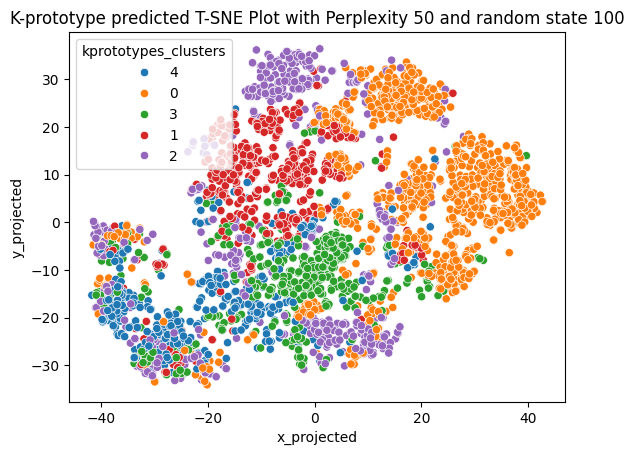

In [ ]:
sample_with_diabetes_combo['kprototypes_clusters'] = cluster_labels.astype(str)

sns.scatterplot(x = 'x_projected', y = 'y_projected', hue = 'kprototypes_clusters', data = sample_with_diabetes_combo)
plt.title('K-prototype predicted T-SNE Plot with Perplexity %s and random state %s' %(perp, rs))
plt.show()

In [ ]:
df_prototypes = pd.DataFrame(kp.cluster_centroids_, columns=X_scaled.columns)
unscaled_prototypes = ss.inverse_transform(df_prototypes[numerical_cols])
df_prototypes[numerical_cols] = unscaled_prototypes
df_prototypes

,BMI,GenHlth,MentHlth,PhysHlth,Age,Education,Income,HighBP,HighChol,Smoker,PhysActivity,DiffWalk,Sex
0,26.537684,1.885110,2.171875,1.676471,6.862132,5.509191,6.985294,0.0,0.0,0.0,1.0,0.0,0.0
1,29.267528,2.570111,1.354244,2.845018,9.298893,5.333948,6.979705,1.0,1.0,1.0,1.0,0.0,1.0
2,27.246296,2.644444,4.366667,5.018519,7.475926,4.540741,5.198148,0.0,0.0,1.0,1.0,0.0,1.0
3,29.963636,2.884091,3.168182,4.556818,9.756818,4.490909,4.915909,1.0,1.0,0.0,1.0,0.0,0.0
4,31.215385,3.612821,8.146154,14.776923,9.669231,4.582051,4.492308,1.0,1.0,1.0,0.0,1.0,0.0


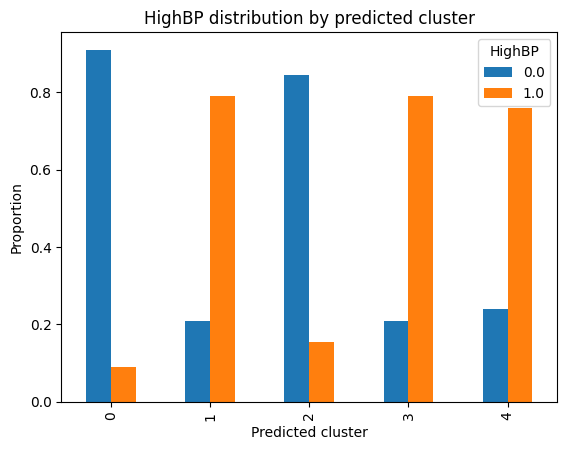

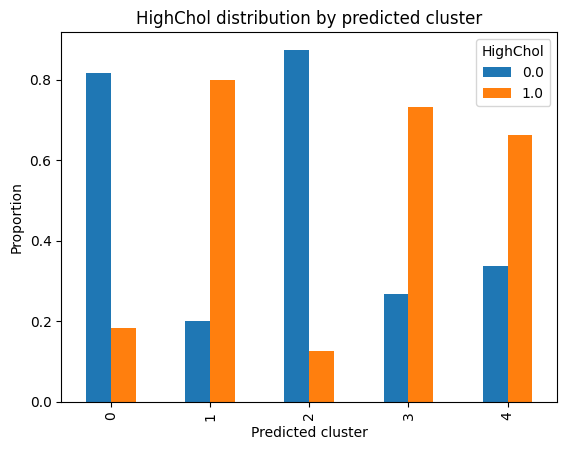

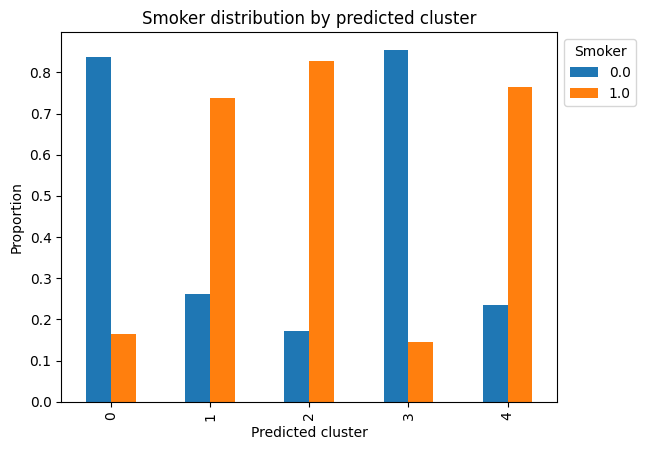

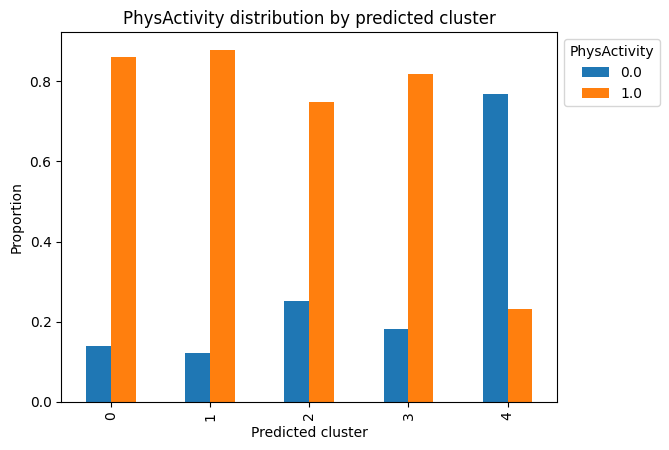

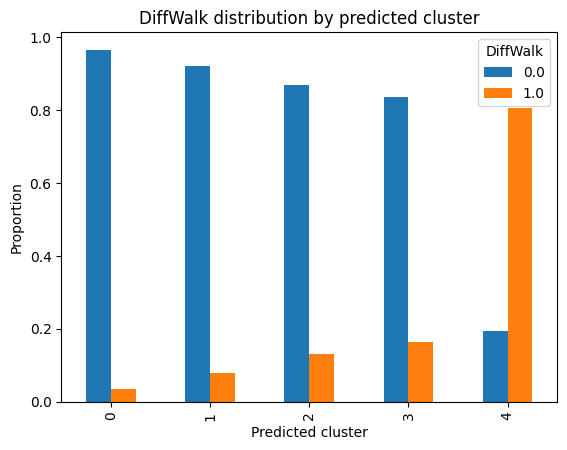

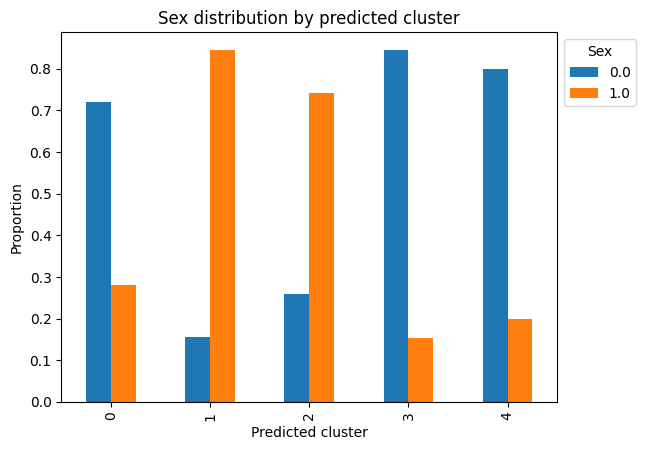

In [ ]:
for cat in categorical_selected_cols:
    ctab = pd.crosstab(
        sample_with_diabetes_combo['kprototypes_clusters'],
        sample_with_diabetes_combo[cat],
        normalize='index'
    )

    ctab.plot.bar()
    plt.title(f'{cat} distribution by predicted cluster')
    plt.xlabel('Predicted cluster')
    plt.ylabel('Proportion')
    plt.legend(title=cat, bbox_to_anchor=(1, 1))
    plt.show()

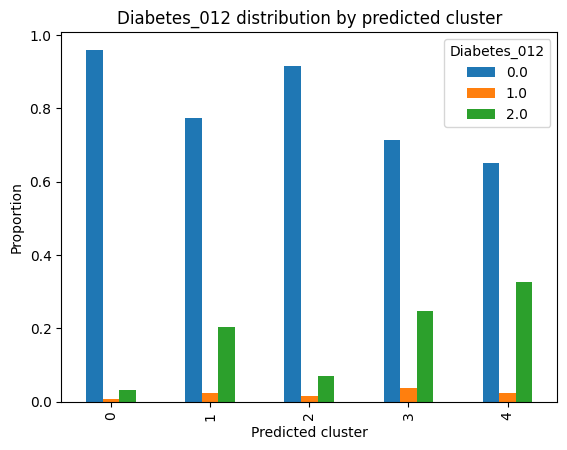

In [ ]:
ctab = pd.crosstab(
    sample_with_diabetes_combo['kprototypes_clusters'],
    sample_with_diabetes_combo['Diabetes_012'],
    normalize='index'
)

ctab.plot.bar()

plt.title('Diabetes_012 distribution by predicted cluster')
plt.xlabel('Predicted cluster')
plt.ylabel('Proportion')
plt.legend(title='Diabetes_012', bbox_to_anchor=(1,1))

plt.show()

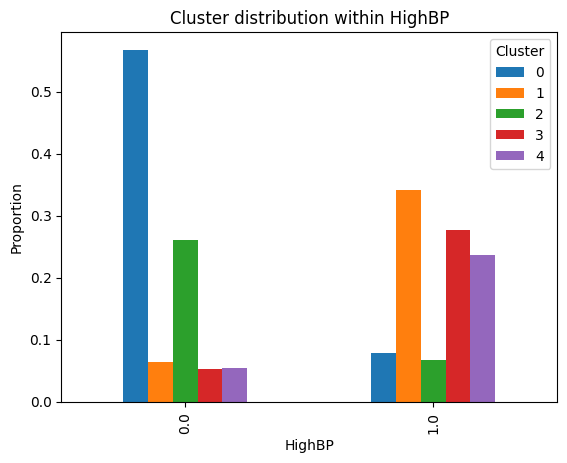

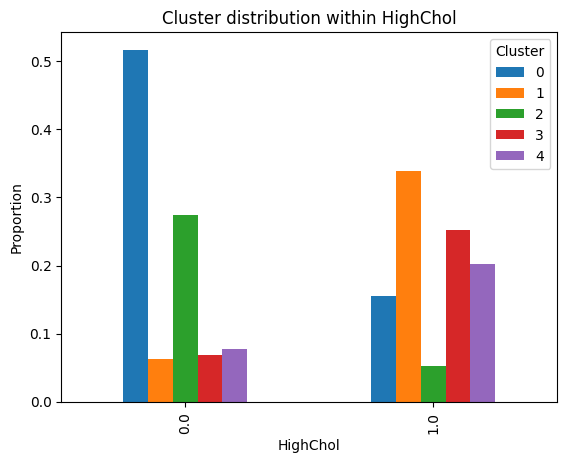

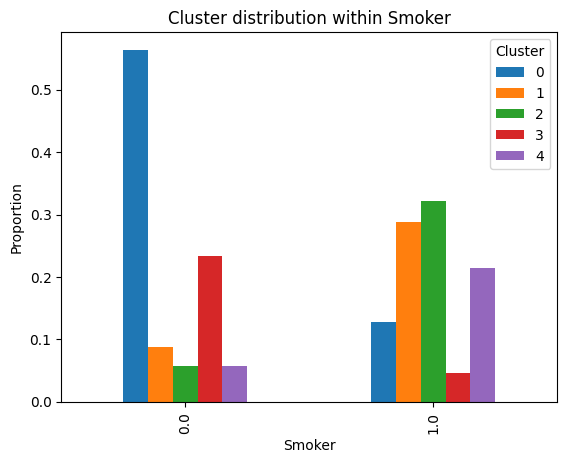

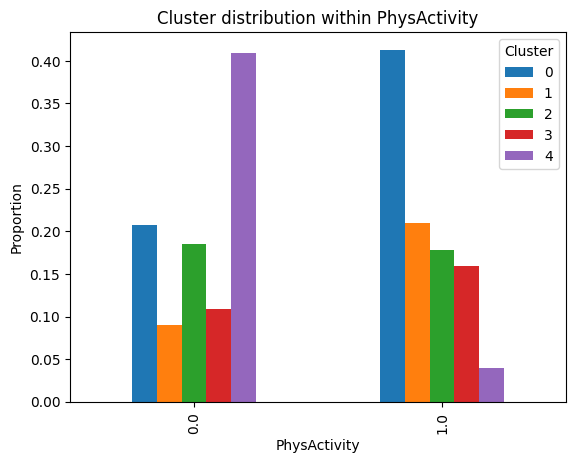

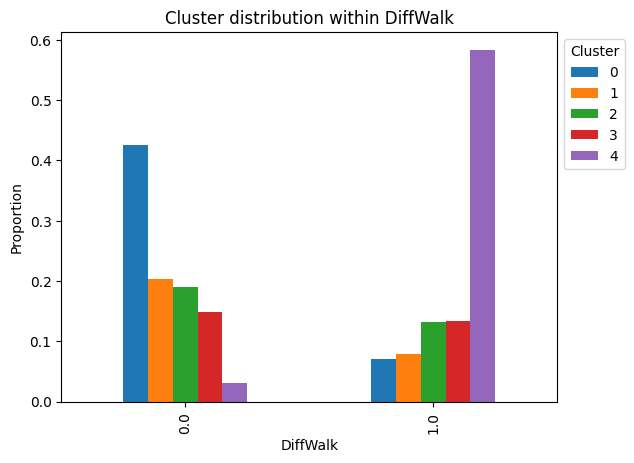

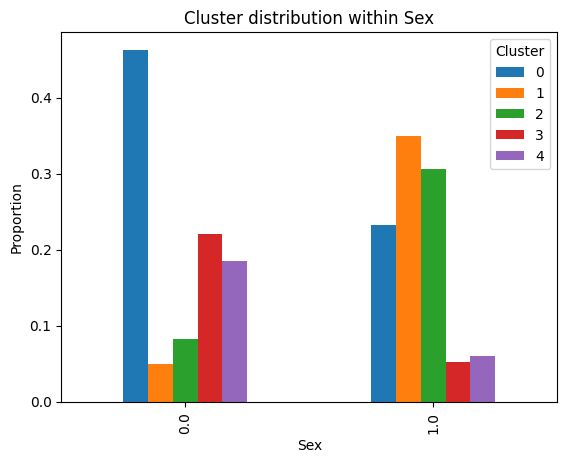

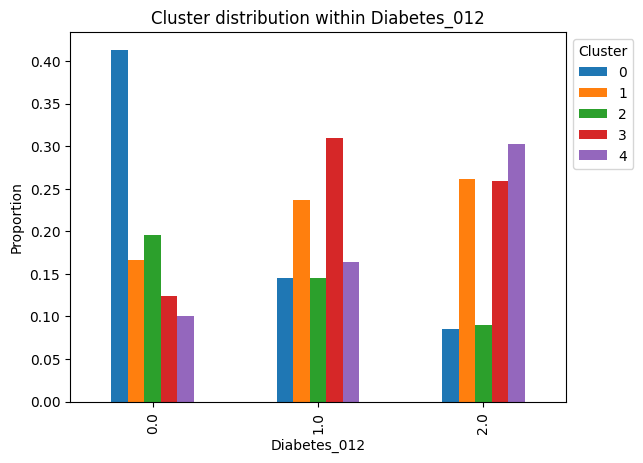

In [ ]:
for cat in categorical_selected_cols + ['Diabetes_012']:

    ctab = pd.crosstab(
        sample_with_diabetes_combo[cat],
        sample_with_diabetes_combo['kprototypes_clusters'],
        normalize='index'
    )

    ctab.plot.bar()

    plt.title(f'Cluster distribution within {cat}')
    plt.xlabel(cat)
    plt.ylabel('Proportion')
    plt.legend(title='Cluster', bbox_to_anchor=(1,1))

    plt.show()

We can observe that cluster 1, 3, and 4 have more individuals with highBP, highChol. Cluster 1 and 4 also have more smoker. Correspondingly, cluster 1, 3, and 4 have more patients with diabetes label 2. This shows that our clustering result have accurately indentify useful inherent clusters.

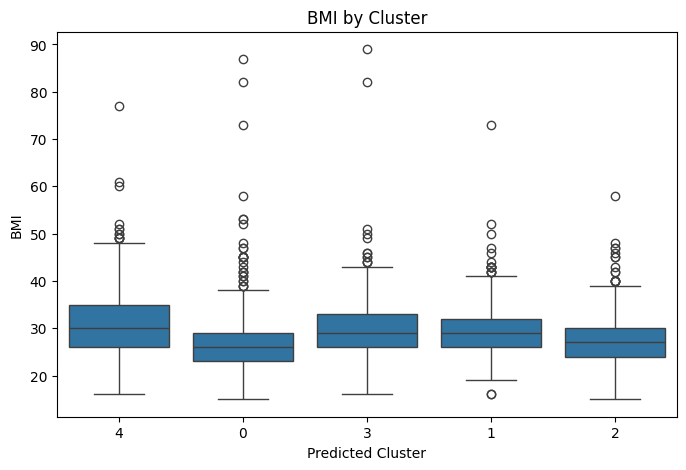

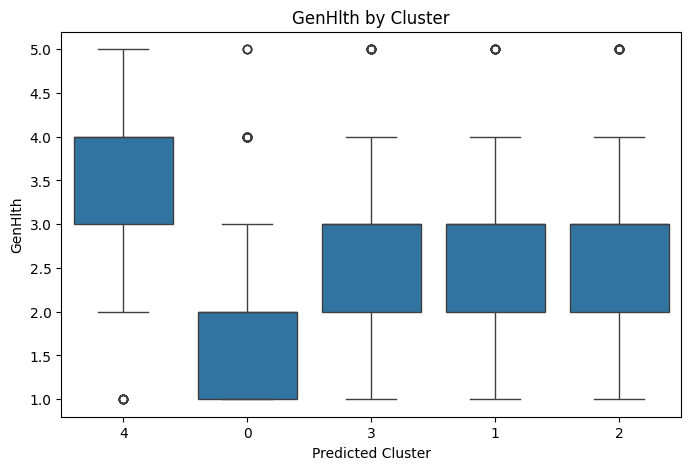

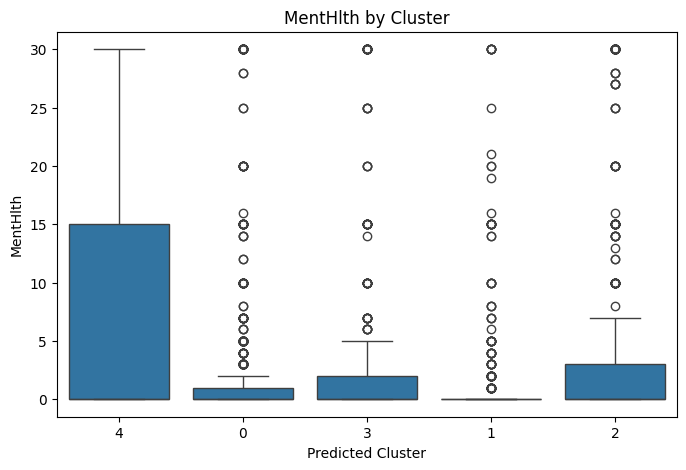

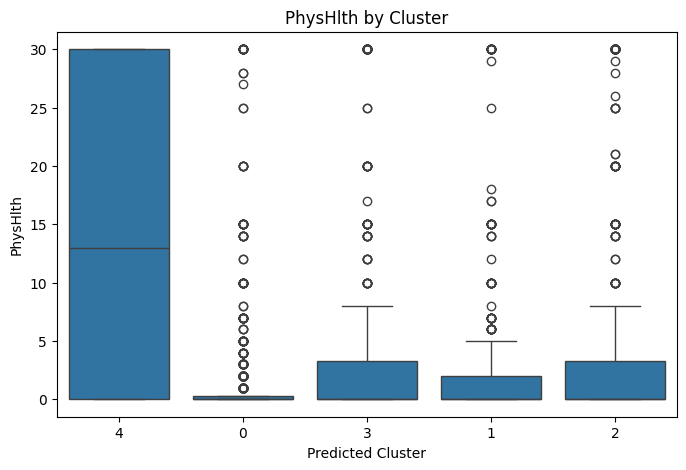

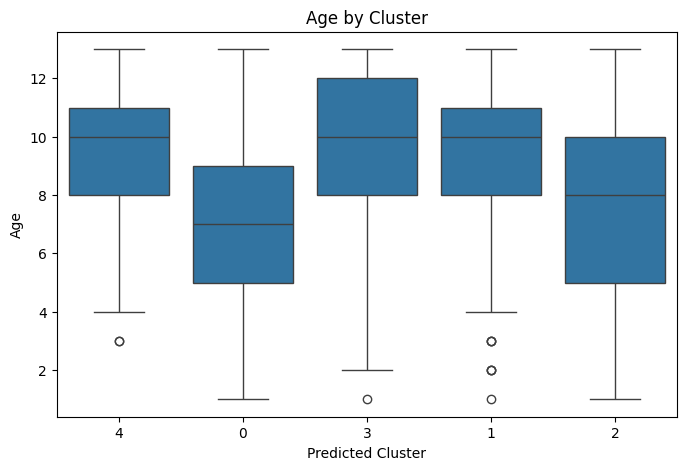

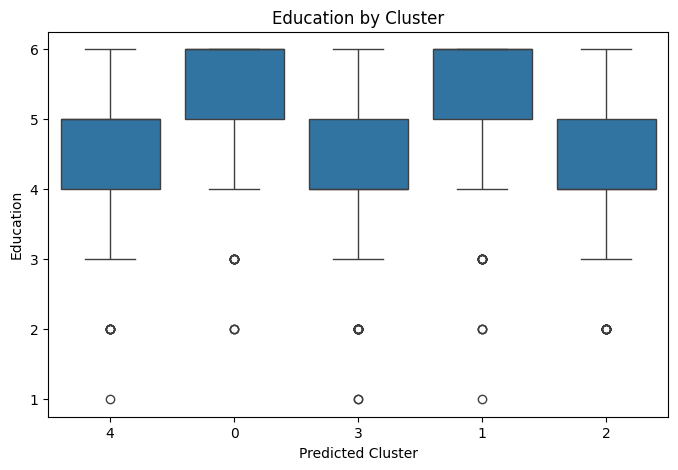

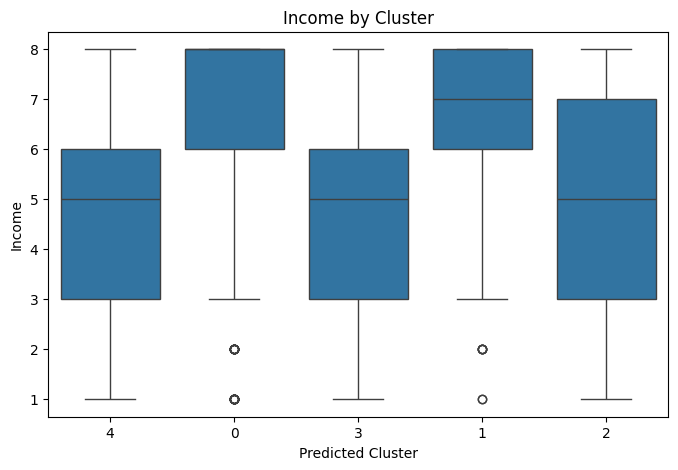

In [ ]:
for col in numerical_cols:

    plt.figure(figsize=(8,5))

    sns.boxplot(
        x=sample_with_diabetes_combo['kprototypes_clusters'],
        y=df_sample[col]   # raw / unscaled values
    )

    plt.title(f'{col} by Cluster')
    plt.xlabel('Predicted Cluster')
    plt.ylabel(col)

    plt.show()

From the box plots of the numerical attributes, clusters 0 and 4 also have distinct characteristics. For example, cluster 0 has the lowest GenHlth, lowest age, and highest income. In contrast, cluster 4 has the highest GenHlth, highest PhysHlth, and lowest income. Cluster 0 has the fewest individuals with more severe diabetes cases and the most healthy individuals, whereas cluster 4 has the fewest healthy individuals and more severe diabetes cases. Therefore, our K-Prototypes algorithm has also identified the clustering structures of the numerical attributes.

### 8.4 Technique Shortcomings

Each of the techniques discussed previously in Section 8 has limitations, since they all function well only under certain ideal conditions.
We used the K-Prototypes elbow plot method to find the best gamma value. However, we only tried five candidates and observed a better clustering structure using the largest candidate value. We could try gamma values greater than 10 to see whether a more significant elbow would appear, but due to our constraints on computational power and time, we cannot try infinitely many gamma values.
The limitations of the T-SNE technique mainly come from the properties of our original dataset. We have confirmed that there are outliers, and the presence of outliers is not an ideal condition for the T-SNE algorithm.
The average silhouette score is most effective when the inherent clusters are well-separated and dense. However, these conditions are not met in our original dataset. Same as the cluster-sorted similarity matrix. Even through there is a block diagnoal structure, but because the clusters are not well-separated, the between-cluster similarity remain high.


## 9. Clustering Algorithm #2 HAC With Average Linkage

In [ ]:
X_cat.head()

,HighBP,HighChol,Smoker,PhysActivity,DiffWalk,Sex
0,1.0,0.0,1.0,1.0,1.0,0.0
1,1.0,0.0,0.0,1.0,0.0,1.0
2,1.0,1.0,0.0,1.0,0.0,0.0
3,1.0,1.0,1.0,1.0,0.0,1.0
4,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
num_dist = squareform(pdist(X_num_scaled, 'euclidean'))**2

sample_categorical_code = X_cat.copy()
label_enc = {}
for col in sample_categorical_code.columns:
    label_enc[col] = preprocessing.LabelEncoder()
    sample_categorical_code[col] = label_enc[col].fit_transform(X_cat[col])
cat_dist = squareform(pdist(sample_categorical_code, 'hamming'))

gamma = 10
dist_gamma_10 = num_dist + gamma*cat_dist
dm = squareform(dist_gamma_10, force='tovector')

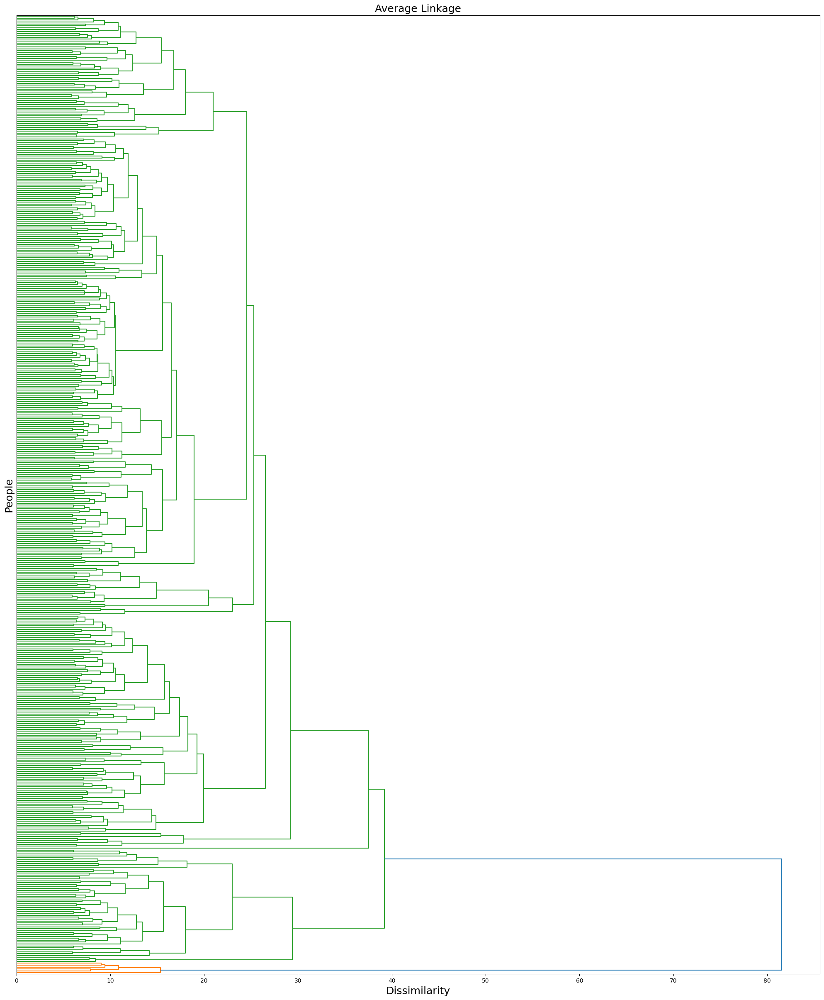

In [ ]:
Z = linkage(dm, method='average')
fig, ax = plt.subplots(figsize=(25,30))
d = dendrogram(Z, orientation='right', ax=ax, truncate_mode='lastp', p=500, no_labels=True)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('People', fontsize=18)

plt.yticks(fontsize=12)
plt.title('Average Linkage', fontsize=18)
plt.show()

### 9.1 t-SNE plots

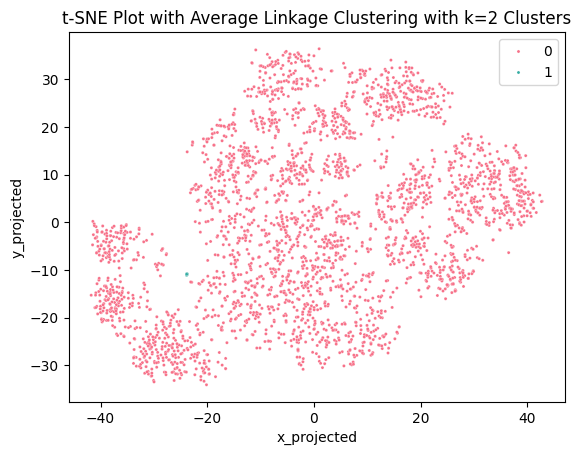

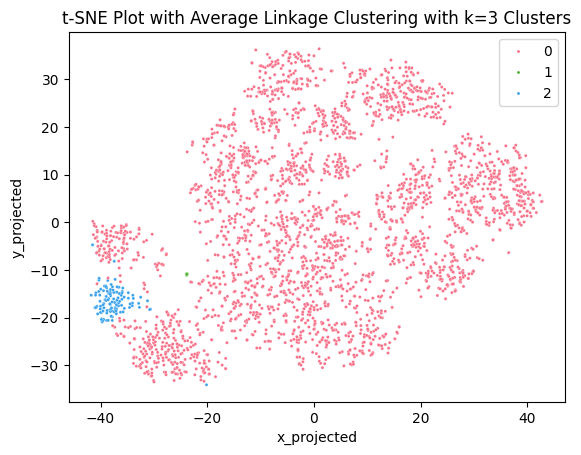

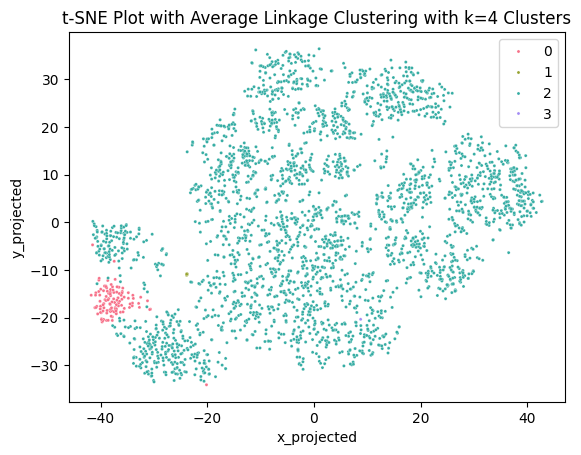

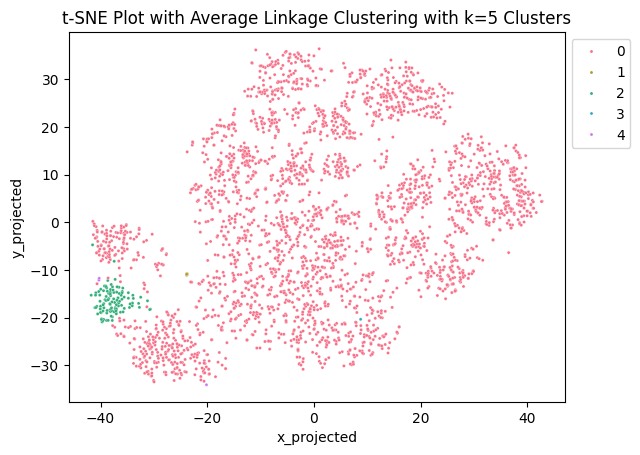

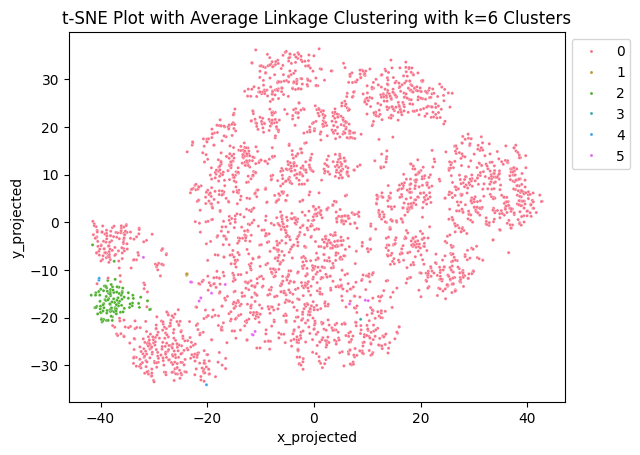

...

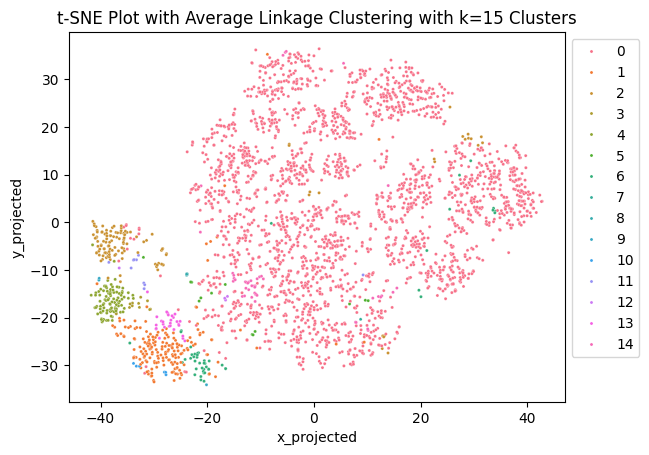

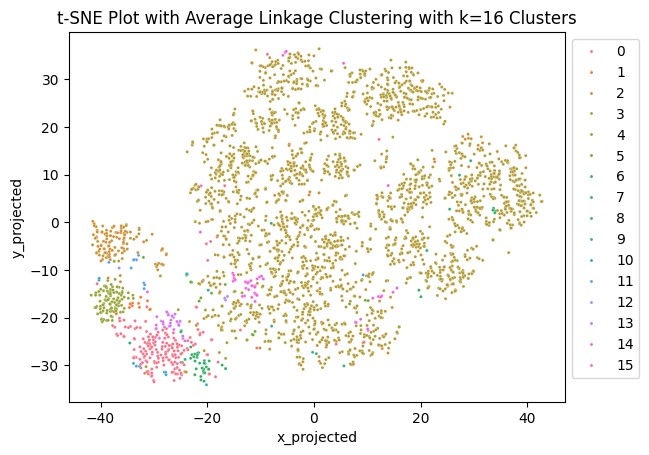

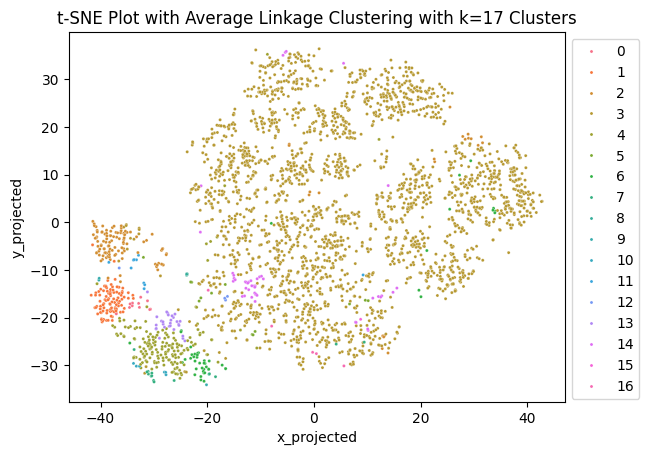

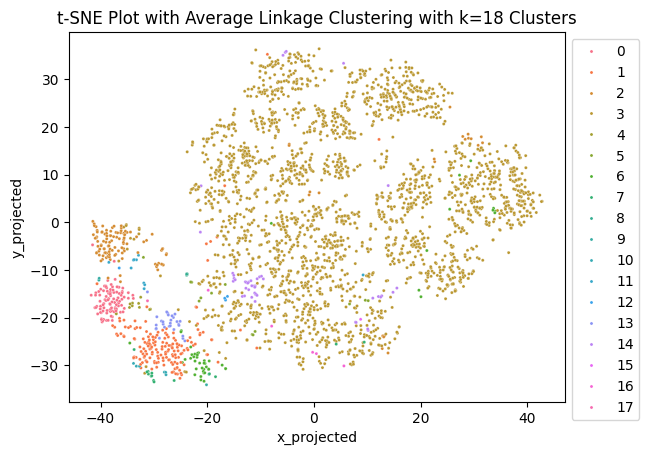

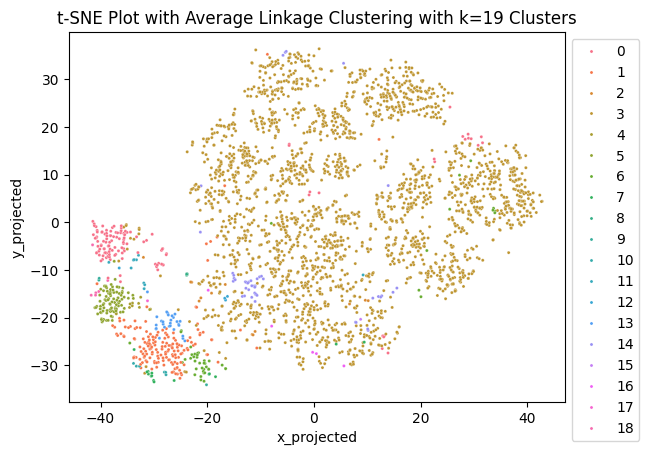

In [ ]:
for k in range(2,20):
    #Clustering from dendrogram with k clusters
    hac = AgglomerativeClustering(n_clusters=k, metric='precomputed', linkage='average')
    sample_with_diabetes_combo['predicted_cluster'] = hac.fit_predict(dist_gamma_10)
    #Map the resulting cluster labels onto our chosen t-SNE plot
    sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster', palette=sns.color_palette("husl", k),
                    data=sample_with_diabetes_combo, s=5)
    plt.title('t-SNE Plot with Average Linkage Clustering with k=%s Clusters' %(k))
    plt.legend(bbox_to_anchor=(1,1))
    plt.show()



We used the same distance matrix, weighted Euclidean and Hamming with gamma = 10, to compute the T-SNE coordinates in Section 9. We ran HAC with average linkage 18 times, and we color-coded the T-SNE plot using the HAC clustering results after each iteration.

We do not want very small clusters, and we want agreement between our HAC clustering results and our T-SNE plot. Overall, k = 3, 7, and 9 produced the clustering results that best meet our research goal, as k = 3, 7, and 9 produced two large clusters, three large clusters, and four large clusters, respectively.

### 9.2 Average Silhouette Score Plots

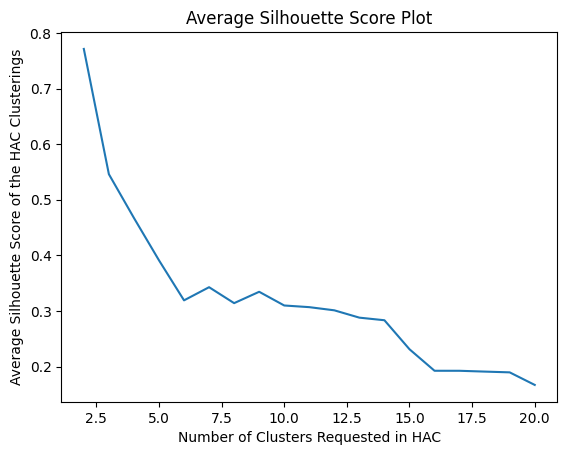

In [ ]:
gamma = 10
k_values = list(range(2, 21))
avg_sil_score_list = []

for k in k_values:
  hac = AgglomerativeClustering(n_clusters=k, metric='precomputed', linkage='average')
  cluster_labels = hac.fit_predict(dist_gamma_10)
  avg_sil_score = silhouette_score(dist_gamma_10, cluster_labels, metric = 'precomputed')
  avg_sil_score_list.append(avg_sil_score)

plt.plot(k_values, avg_sil_score_list)
plt.xticks(range(2,20))
plt.xlabel('Number of Clusters Requested in HAC')
plt.ylabel('Average Silhouette Score of the HAC Clusterings')
plt.title('Average Silhouette Score Plot')
plt.show()

We also applied the average silhouette score technique to help select the best k value(s). We want to select the number of clusters that produces HAC clusterings with overall higher average silhouette scores.

From the plot, we selected k = 3, k = 7, and k = 9, which produced overall higher average silhouette scores. These three selected k-values agree with our conclusion in section 9.1. We have reaons to believe that these clusterings are in alignment with our research goals.

### 9.3 Cluster-Sorted Similarity Matrix

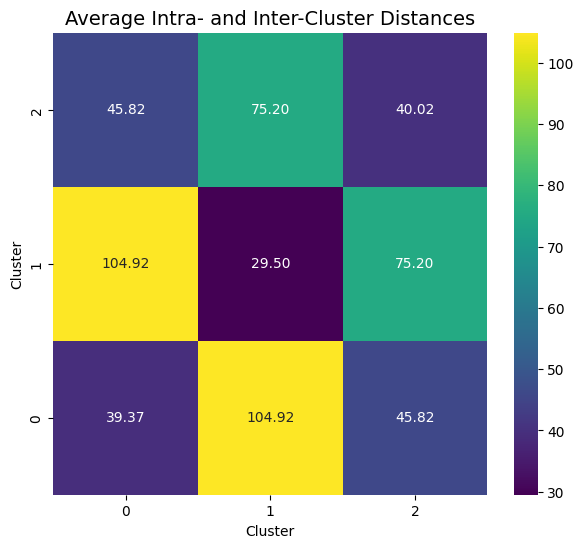

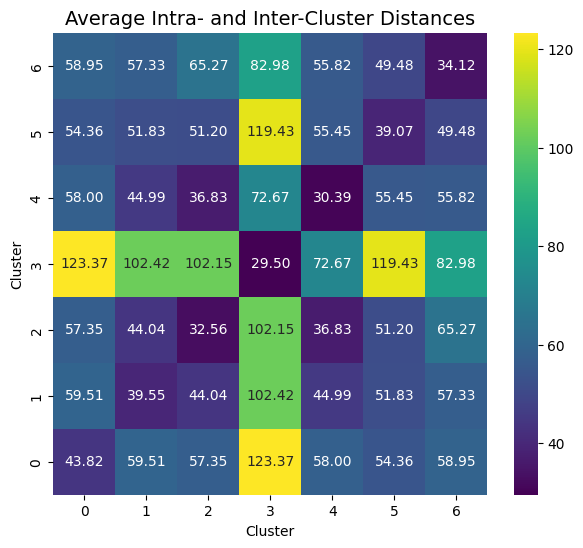

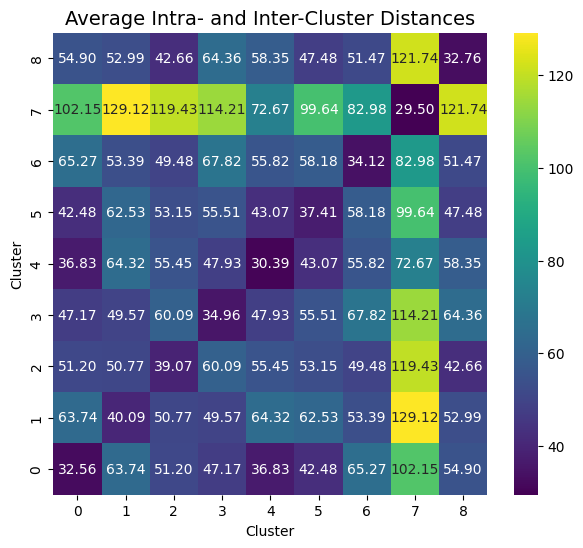

In [ ]:
gamma = 10
k_values = [3,7, 9]

for k in k_values:

    hac = AgglomerativeClustering(n_clusters=k, metric='precomputed', linkage='complete')
    cluster_labels = hac.fit_predict(dist_gamma_10)

    num_df = X_num_scaled.copy()
    cat_df = X_cat.copy()

    num_df['hac_clusters'] = cluster_labels
    num_sample_sort = num_df.sort_values(by='hac_clusters')
    num_sample_sort = num_sample_sort.drop('hac_clusters', axis=1)

    cat_df['hac_clusters'] = cluster_labels

    end_points = cat_df['hac_clusters'].value_counts().sort_index().cumsum()

    cat_sample_sort = cat_df.sort_values(by='hac_clusters')
    cat_sample_sort = cat_sample_sort.drop('hac_clusters', axis=1)

    avg_dist_mat=np.zeros((len(end_points), len(end_points)))

    num_dist = squareform(pdist(num_sample_sort, metric='euclidean')) ** 2

    sample_categorical_code = cat_sample_sort.copy()
    label_enc = {}

    for col in sample_categorical_code.columns:
        label_enc[col] = preprocessing.LabelEncoder()
        sample_categorical_code[col] = label_enc[col].fit_transform(
            sample_categorical_code[col].astype(str)
        )

    cat_dist = squareform(
        pdist(sample_categorical_code.values, metric='hamming')
    ) * sample_categorical_code.shape[1]

    dist_gamma_10_sorted = num_dist + gamma * cat_dist


    for i in range(0,len(end_points)):
        for j in range(0,len(end_points)):
            #Start points and end points of block
            start_i = 0 if i == 0 else end_points[i-1]
            start_j = 0 if j == 0 else end_points[j-1]
            end_i = end_points[i]
            end_j = end_points[j]

            #Block mean distance
            block = dist_gamma_10_sorted[start_i:end_i, start_j:end_j]
            avg_dist_mat[i, j] = block.mean()

    avg_dist_df = pd.DataFrame(avg_dist_mat, index=range(0,len(end_points)), columns=range(0,len(end_points)))


    avg_dist_df_flipped = avg_dist_df.iloc[::-1]


    plt.figure(figsize=(7,6))
    sns.heatmap(avg_dist_df_flipped, annot=True, fmt=".2f", cmap="viridis")
    plt.title("Average Intra- and Inter-Cluster Distances", fontsize=14)
    plt.ylabel("Cluster")
    plt.xlabel("Cluster")
    plt.show()

Using the cluster-sorted similarity matrix, we can see that for all k=3, k=7, and k=9, the diagonal structures are decent, with darker squares on the diagonal and lighter squares in the rest of the area. This means that our clusterings with k=3, k=7, and k=9 using HAC produce good inter-cluster separation and intra-cluster cohesion.

The conclusions from these three cluster-sorted matrices also agree with our conclusions in Sections 9.1 and 9.2.

### 9.4.1 “Best” Clustering Algorithm Result Presentation and Post Analysis: 2 large clusters

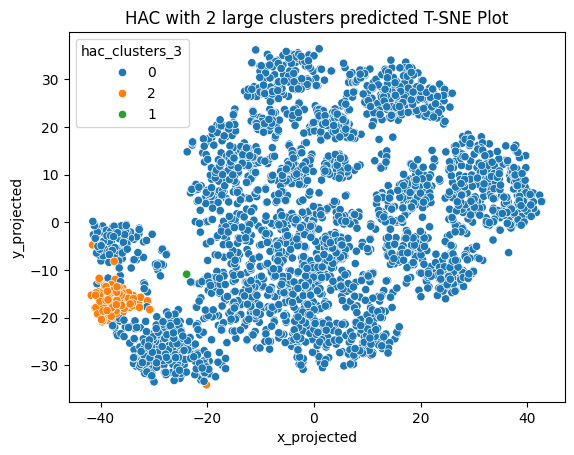

In [ ]:
hac = AgglomerativeClustering(n_clusters=3, metric='precomputed', linkage='average')
cluster_labels = hac.fit_predict(dist_gamma_10)

sample_with_diabetes_combo['hac_clusters_3'] = cluster_labels.astype(str)

sns.scatterplot(x = 'x_projected', y = 'y_projected', hue = 'hac_clusters_3', data = sample_with_diabetes_combo)
plt.title('HAC with 2 large clusters predicted T-SNE Plot')
plt.show()


In [ ]:
sample_with_diabetes_combo['hac_clusters_3'].value_counts()

,count
hac_clusters_3,
0,2884
2,109
1,7


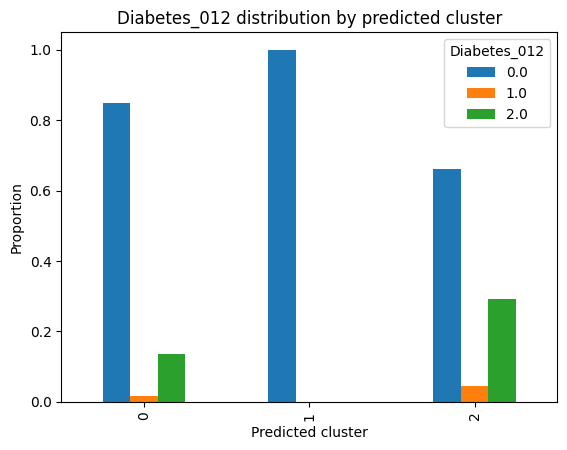

In [ ]:
ctab = pd.crosstab(
    sample_with_diabetes_combo['hac_clusters_3'],
    sample_with_diabetes_combo['Diabetes_012'],
    normalize='index'
)

ctab.plot.bar()

plt.title('Diabetes_012 distribution by predicted cluster')
plt.xlabel('Predicted cluster')
plt.ylabel('Proportion')
plt.legend(title='Diabetes_012', bbox_to_anchor=(1,1))

plt.show()

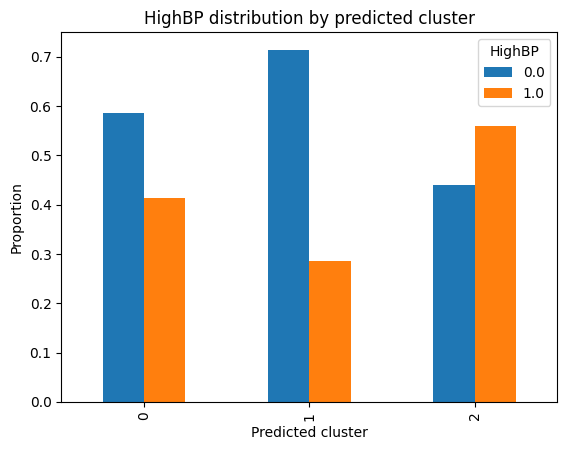

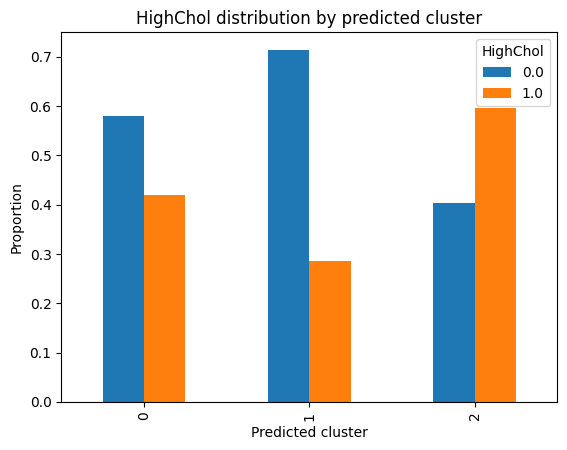

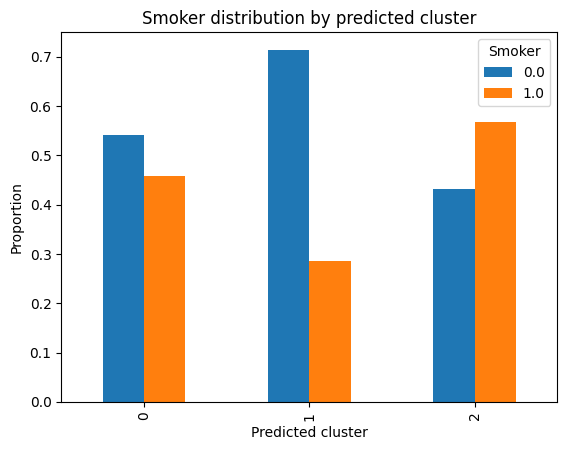

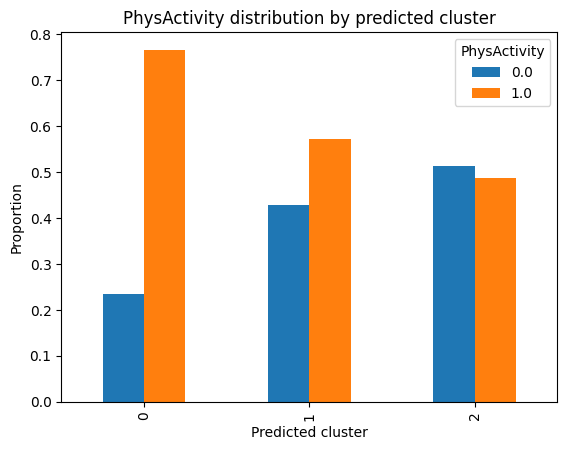

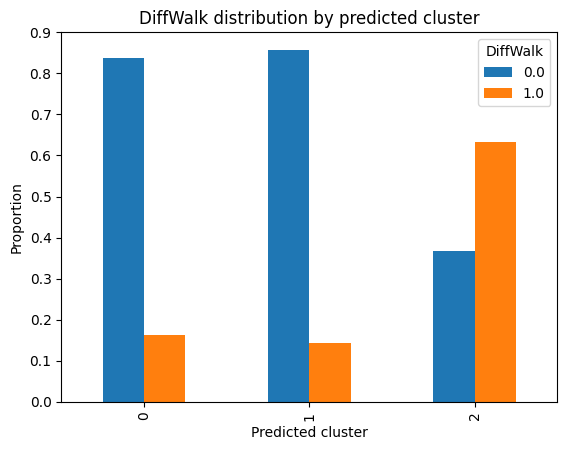

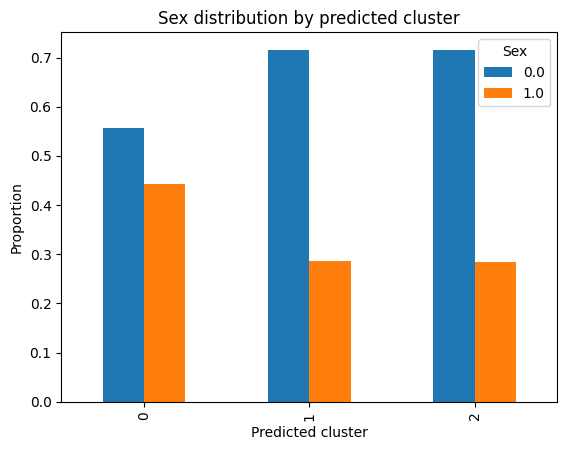

In [ ]:
for cat in categorical_selected_cols:
    ctab = pd.crosstab(
        sample_with_diabetes_combo['hac_clusters_3'],
        sample_with_diabetes_combo[cat],
        normalize='index'
    )

    ctab.plot.bar()
    plt.title(f'{cat} distribution by predicted cluster')
    plt.xlabel('Predicted cluster')
    plt.ylabel('Proportion')
    plt.legend(title=cat, bbox_to_anchor=(1, 1))
    plt.show()

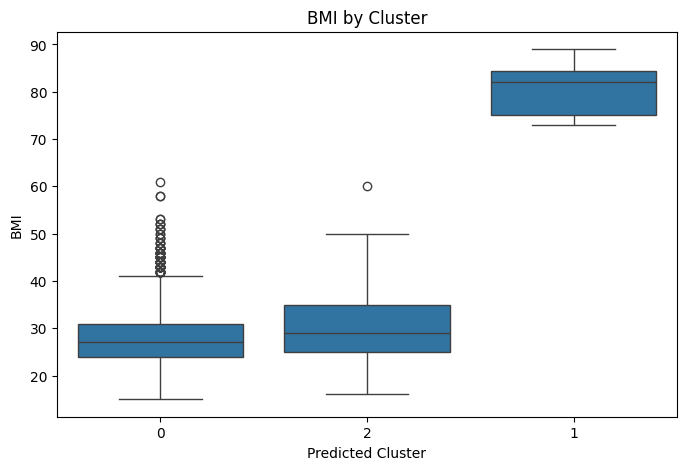

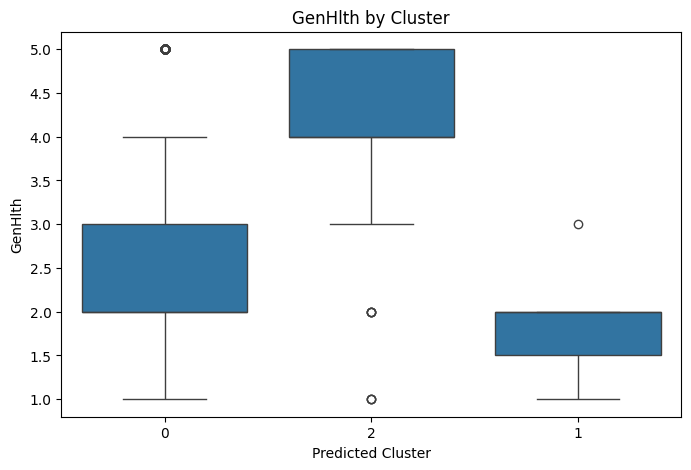

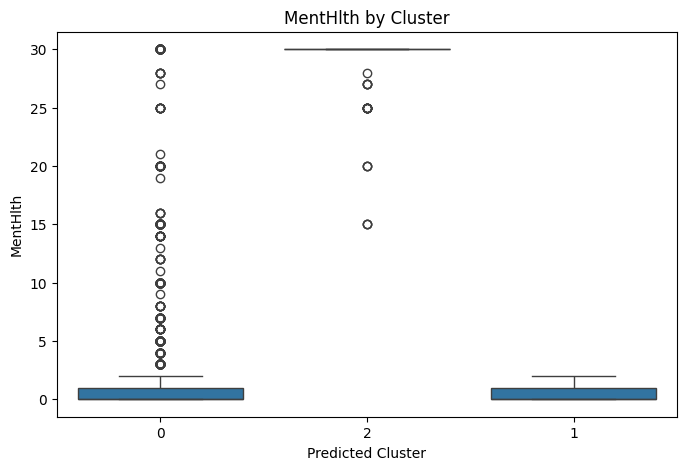

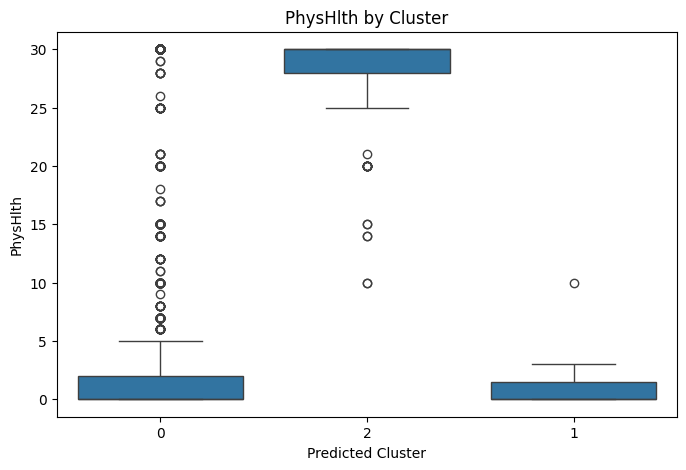

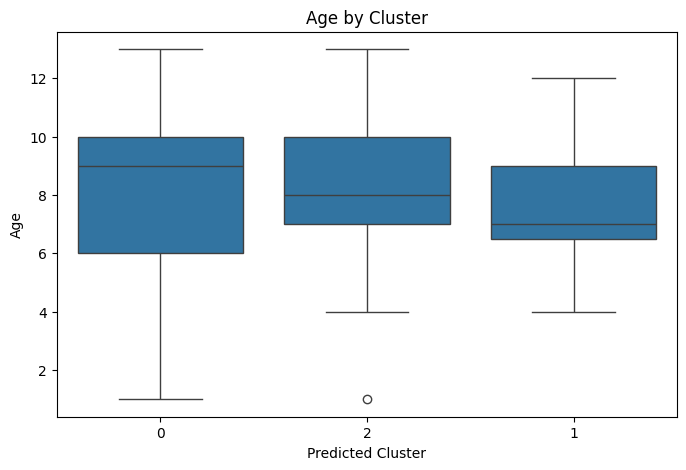

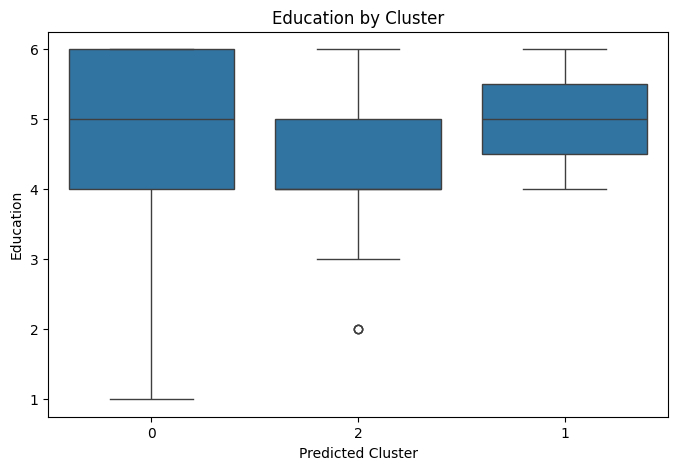

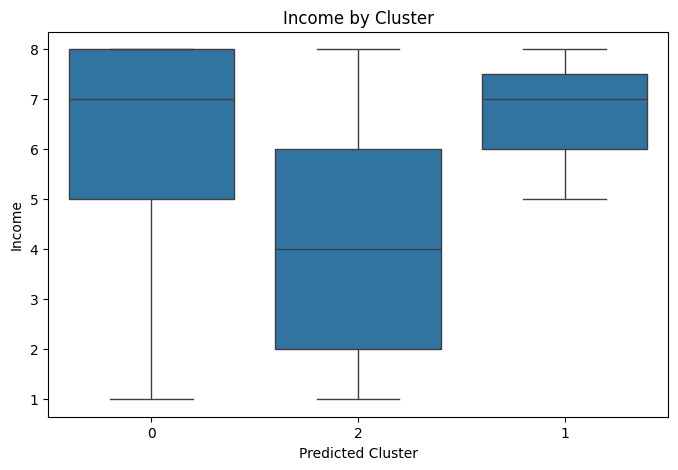

In [ ]:
for col in numerical_cols:

    plt.figure(figsize=(8,5))

    sns.boxplot(
        x=sample_with_diabetes_combo['hac_clusters_3'],
        y=df_sample[col]   # raw / unscaled values
    )

    plt.title(f'{col} by Cluster')
    plt.xlabel('Predicted Cluster')
    plt.ylabel(col)

    plt.show()


Using k=3, we get two large clusters, which are cluster 0 and cluster 2. This clustering partially aligns with the T-SNE plot. It only identifies one of the smaller clusters and clusters the rest of the observations into a huge cluster.

From the bar and box plots, we can observe that more cluster 0 individuals have PhysActivity=1, DiffWalk=1, lower GenHlth, lower PhysHlth, and higher Income. In contrast, more cluster 2 individuals have PhysActivity=0, DiffWalk=0, higher GenHlth, higher PhysHlth, and lower Income.

We can also see from the bar plots that both clusters contain some patients with severe diabetes. Cluster 2 contains a few more cases, but the discrepancy is not significant.

### 9.4.2 “Best” Clustering Algorithm Result Presentation and Post Analysis: 3 large clusters

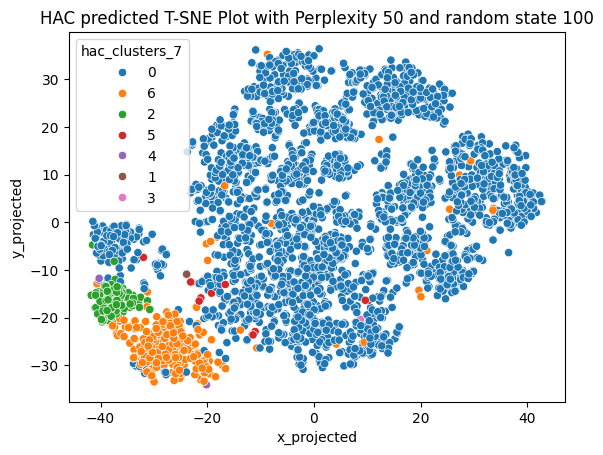

In [ ]:
hac = AgglomerativeClustering(n_clusters=7, metric='precomputed', linkage='average')
cluster_labels = hac.fit_predict(dist_gamma_10)

sample_with_diabetes_combo['hac_clusters_7'] = cluster_labels.astype(str)

sns.scatterplot(x = 'x_projected', y = 'y_projected', hue = 'hac_clusters_7', data = sample_with_diabetes_combo)
plt.title('HAC predicted T-SNE Plot with Perplexity %s and random state %s' %(perp, rs))
plt.show()

In [ ]:
sample_with_diabetes_combo['hac_clusters_7'].value_counts()

,count
hac_clusters_7,
0,2614
6,256
2,106
5,13
1,7
4,3
3,1


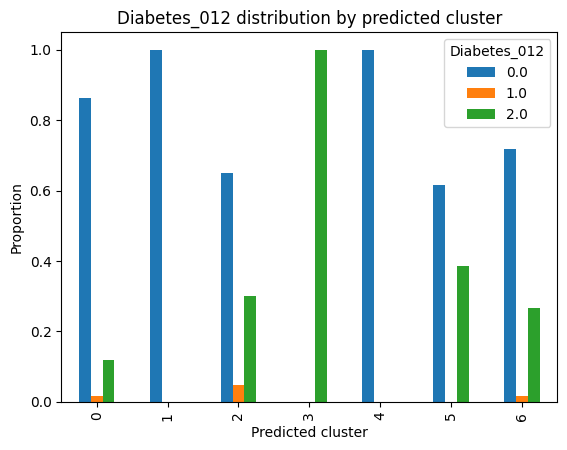

In [ ]:
ctab = pd.crosstab(
    sample_with_diabetes_combo['hac_clusters_7'],
    sample_with_diabetes_combo['Diabetes_012'],
    normalize='index'
)

ctab.plot.bar()

plt.title('Diabetes_012 distribution by predicted cluster')
plt.xlabel('Predicted cluster')
plt.ylabel('Proportion')
plt.legend(title='Diabetes_012', bbox_to_anchor=(1,1))

plt.show()

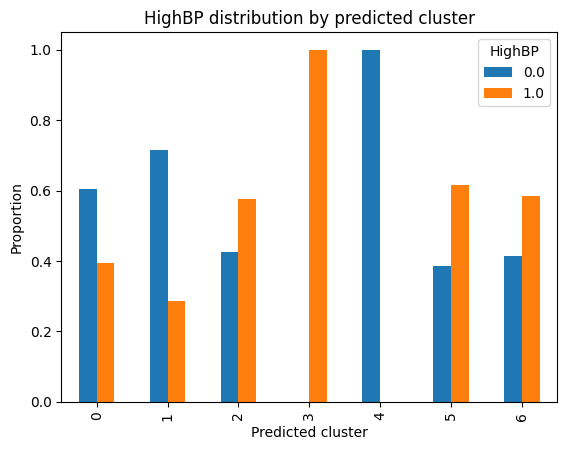

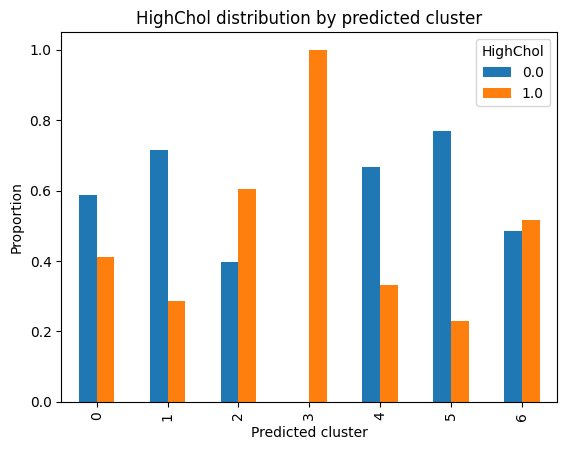

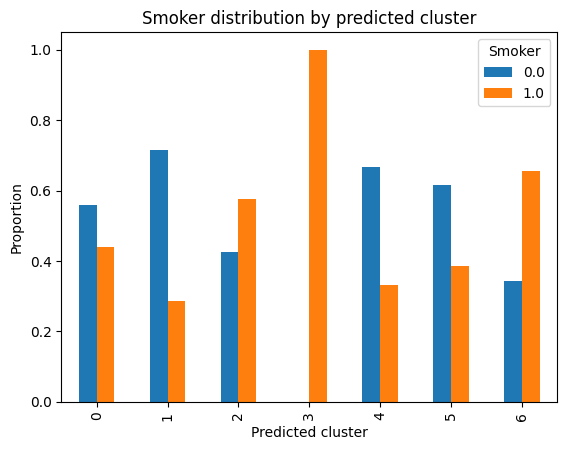

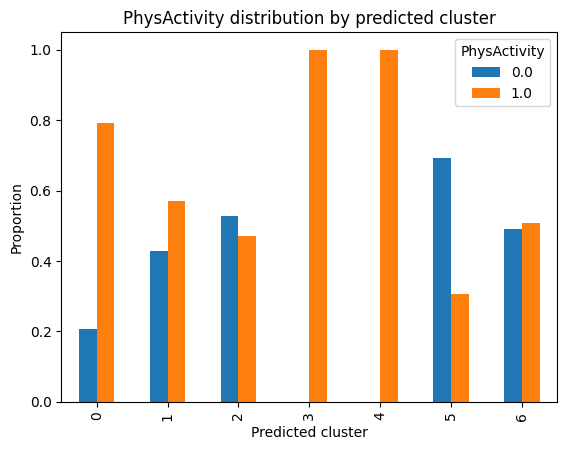

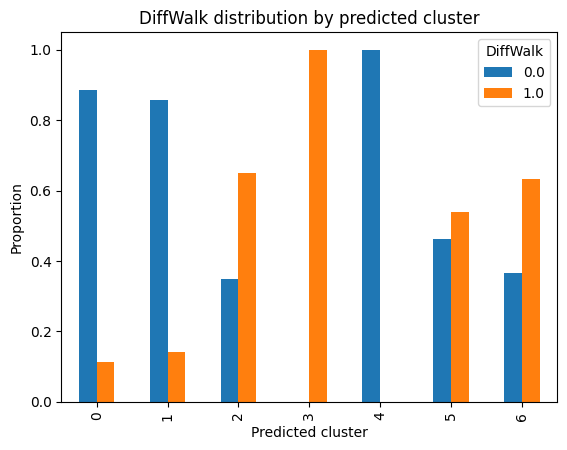

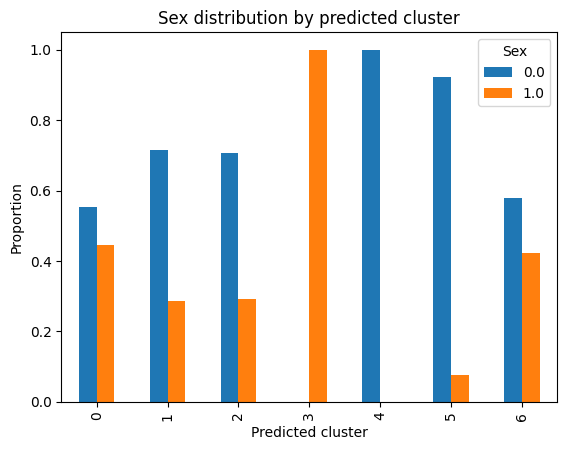

In [ ]:
for cat in categorical_selected_cols:
    ctab = pd.crosstab(
        sample_with_diabetes_combo['hac_clusters_7'],
        sample_with_diabetes_combo[cat],
        normalize='index'
    )

    ctab.plot.bar()
    plt.title(f'{cat} distribution by predicted cluster')
    plt.xlabel('Predicted cluster')
    plt.ylabel('Proportion')
    plt.legend(title=cat, bbox_to_anchor=(1, 1))
    plt.show()

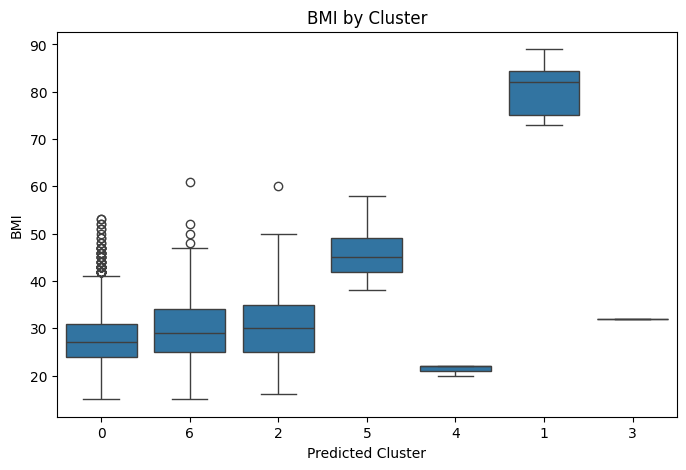

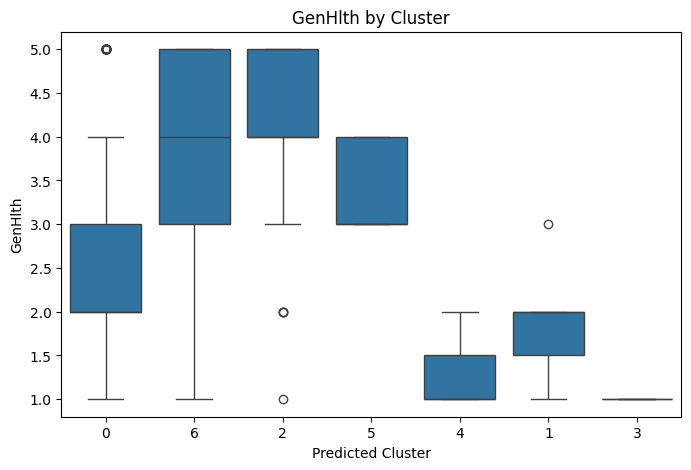

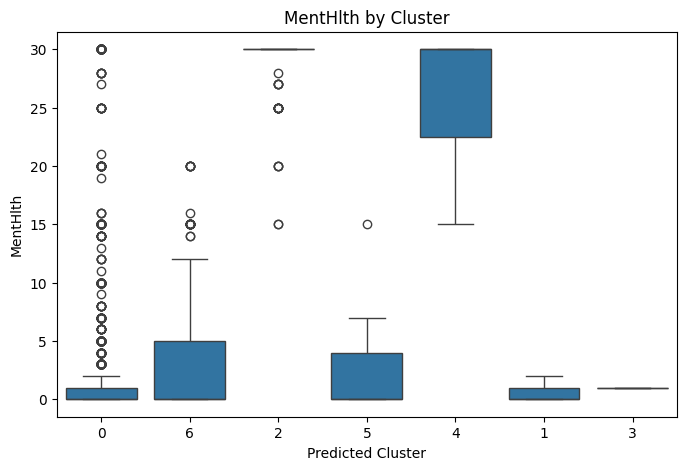

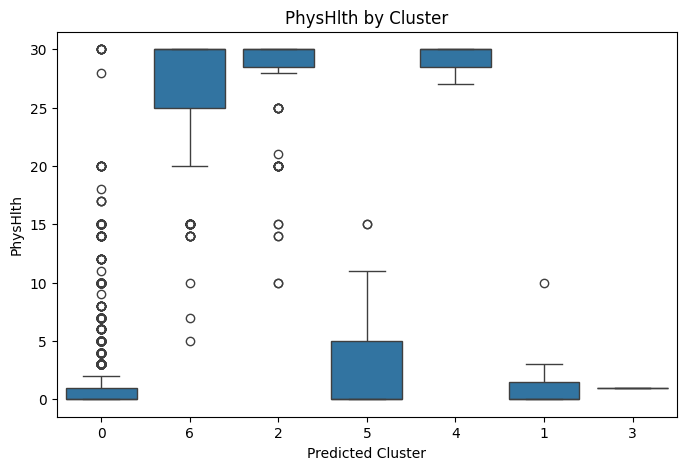

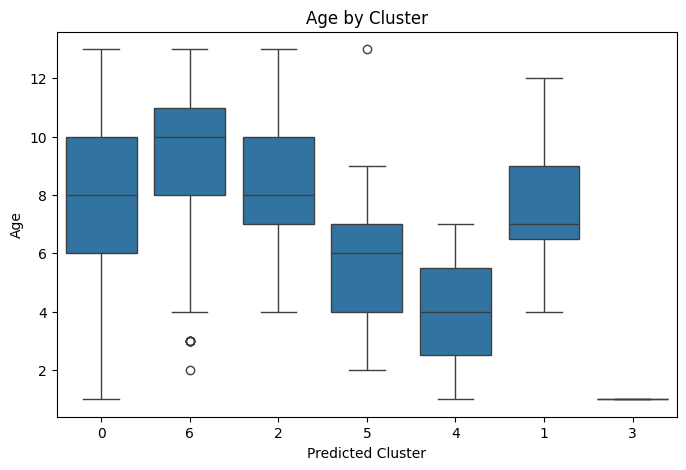

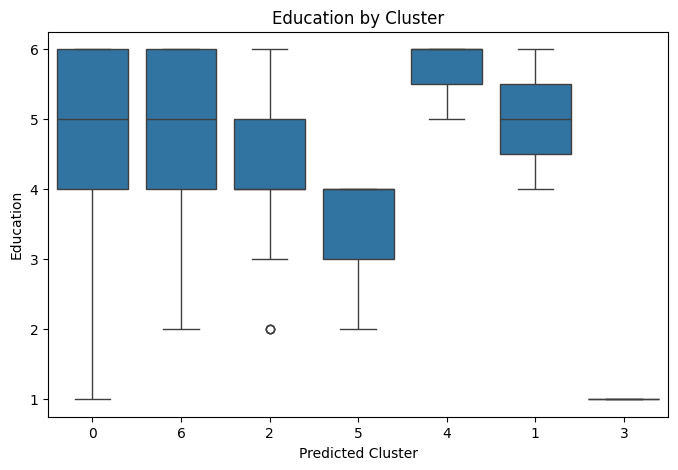

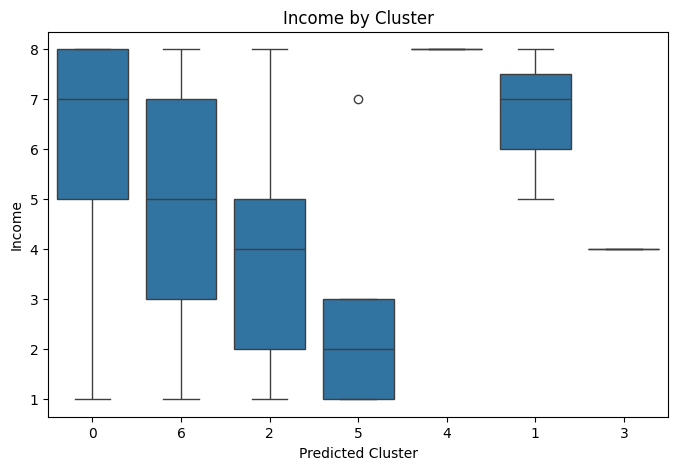

In [ ]:
for col in numerical_cols:

    plt.figure(figsize=(8,5))

    sns.boxplot(
        x=sample_with_diabetes_combo['hac_clusters_7'],
        y=df_sample[col]   # raw / unscaled values
    )

    plt.title(f'{col} by Cluster')
    plt.xlabel('Predicted Cluster')
    plt.ylabel(col)

    plt.show()

Using k=7, we get three large clusters, which are cluster 0, cluster 6 and cluster 2. This clustering has better alignment with the T-SNE plot compared to our 'best' clustering 1. But it still does not perfectly align with the T-SNE plot.

### 9.4.3 “Best” Clustering Algorithm Result Presentation and Post Analysis: 4 large clusters

In [ ]:
dist_gamma_10

array([[ 0.        ,  9.78811764,  9.99001765, ..., 22.13500188,
        14.3575108 , 12.43041977],
       [ 9.78811764,  0.        , 14.10454579, ..., 17.29790471,
        21.93944449, 18.40989353],
       [ 9.99001765, 14.10454579,  0.        , ..., 30.57823987,
         7.95065238,  7.66432515],
       ...,
       [22.13500188, 17.29790471, 30.57823987, ...,  0.        ,
        34.98222515, 28.56329231],
       [14.3575108 , 21.93944449,  7.95065238, ..., 34.98222515,
         0.        ,  6.30183832],
       [12.43041977, 18.40989353,  7.66432515, ..., 28.56329231,
         6.30183832,  0.        ]])

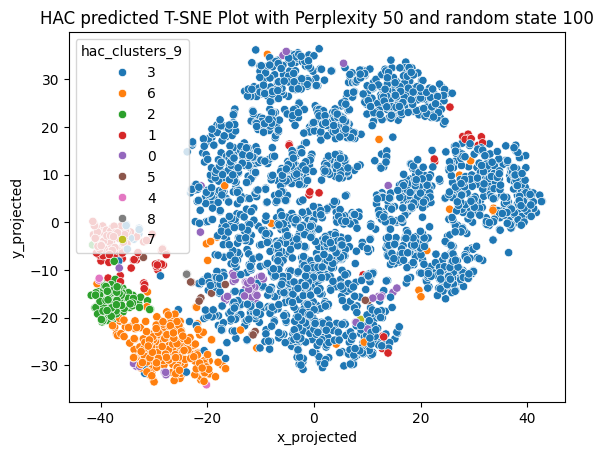

In [ ]:
hac = AgglomerativeClustering(n_clusters=9, metric='precomputed', linkage='average')
cluster_labels = hac.fit_predict(dist_gamma_10)

sample_with_diabetes_combo['hac_clusters_9'] = cluster_labels.astype(str)

sns.scatterplot(x = 'x_projected', y = 'y_projected', hue = 'hac_clusters_9', data = sample_with_diabetes_combo)
plt.title('HAC predicted T-SNE Plot with Perplexity %s and random state %s' %(perp, rs))
plt.show()

In [ ]:
sample_with_diabetes_combo['hac_clusters_9'].value_counts()

,count
hac_clusters_9,
3,2423
6,256
1,136
2,106
0,55
5,13
8,7
4,3
7,1


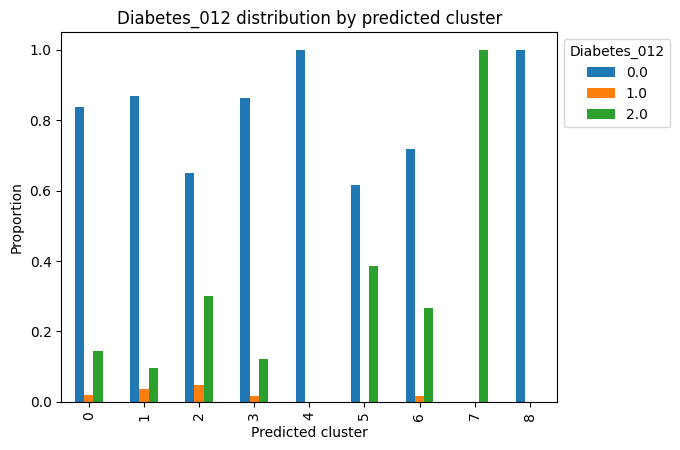

In [ ]:
ctab = pd.crosstab(
    sample_with_diabetes_combo['hac_clusters_9'],
    sample_with_diabetes_combo['Diabetes_012'],
    normalize='index'
)

ctab.plot.bar()

plt.title('Diabetes_012 distribution by predicted cluster')
plt.xlabel('Predicted cluster')
plt.ylabel('Proportion')
plt.legend(title='Diabetes_012', bbox_to_anchor=(1,1))

plt.show()

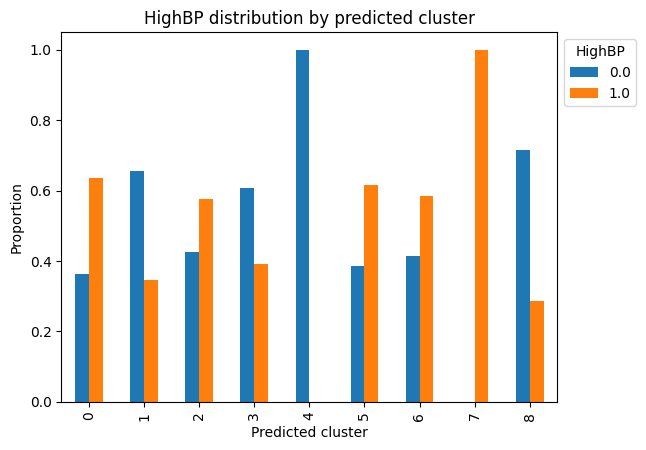

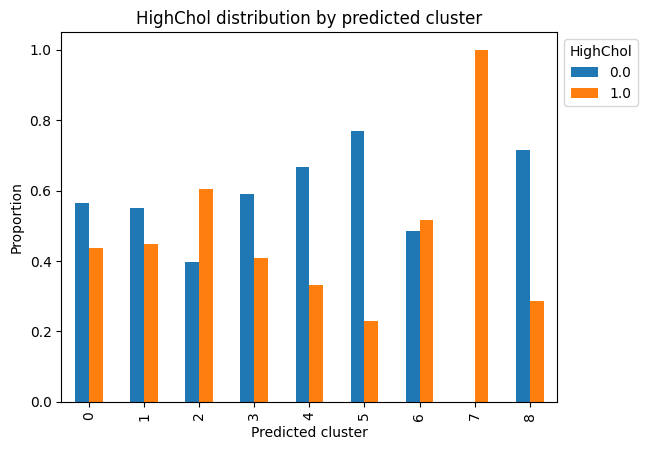

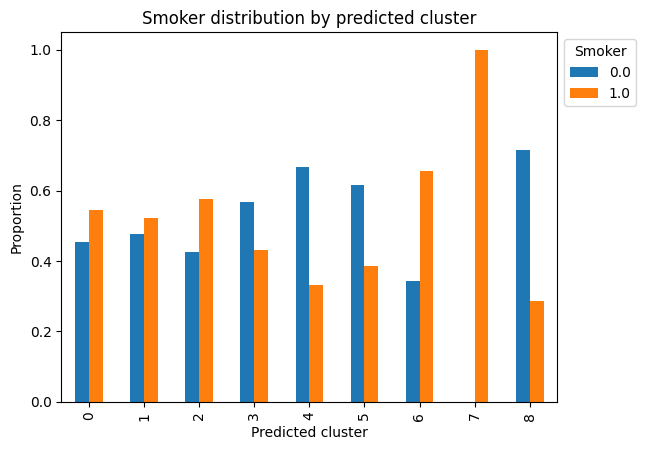

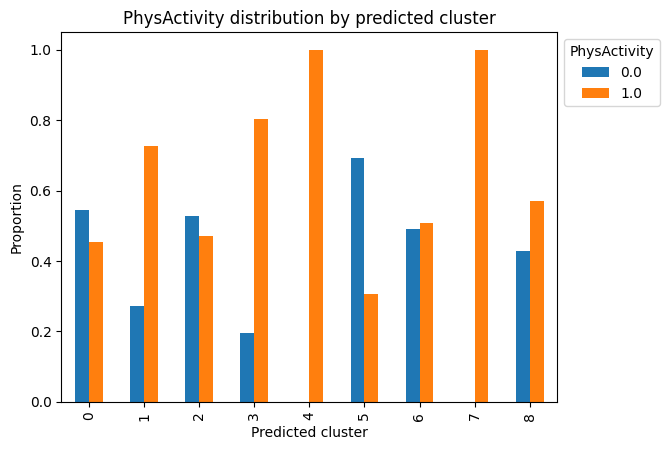

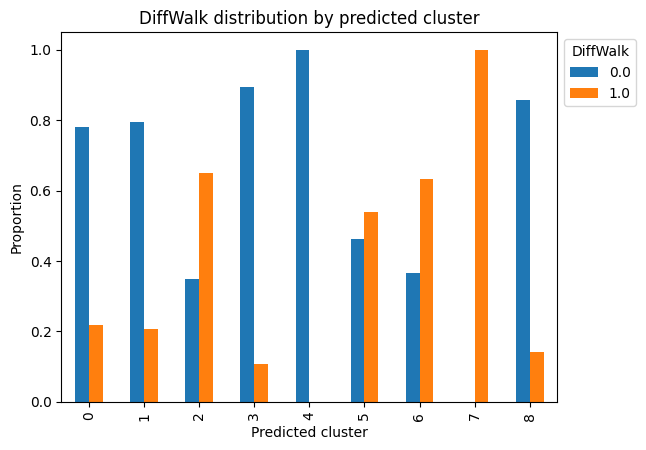

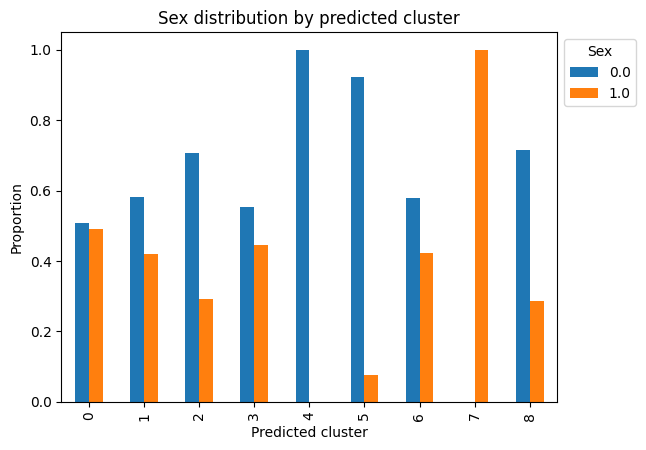

In [ ]:
for cat in categorical_selected_cols:
    ctab = pd.crosstab(
        sample_with_diabetes_combo['hac_clusters'],
        sample_with_diabetes_combo[cat],
        normalize='index'
    )

    ctab.plot.bar()
    plt.title(f'{cat} distribution by predicted cluster')
    plt.xlabel('Predicted cluster')
    plt.ylabel('Proportion')
    plt.legend(title=cat, bbox_to_anchor=(1, 1))
    plt.show()

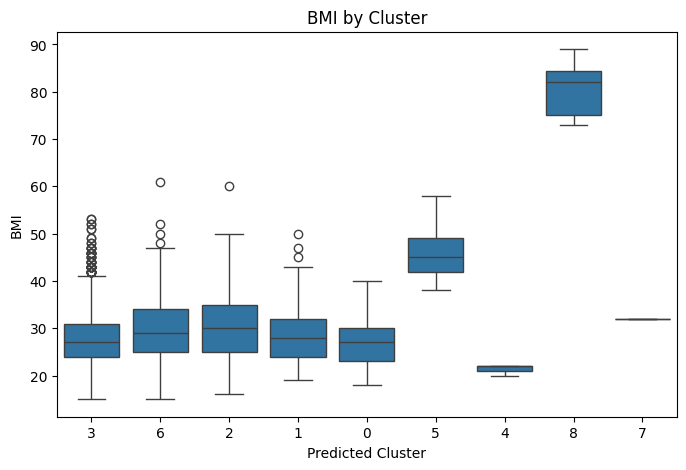

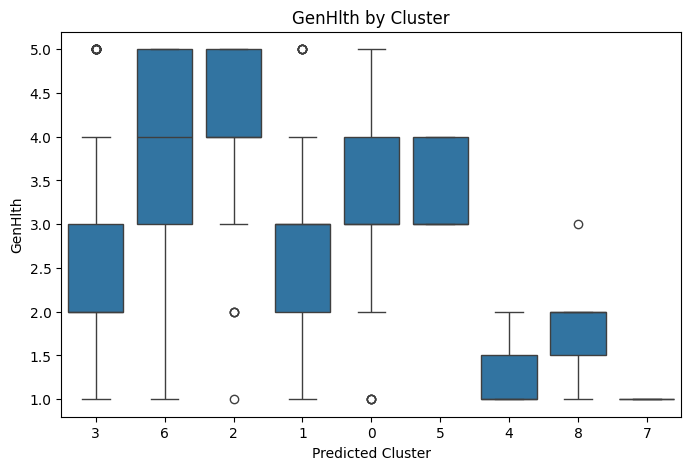

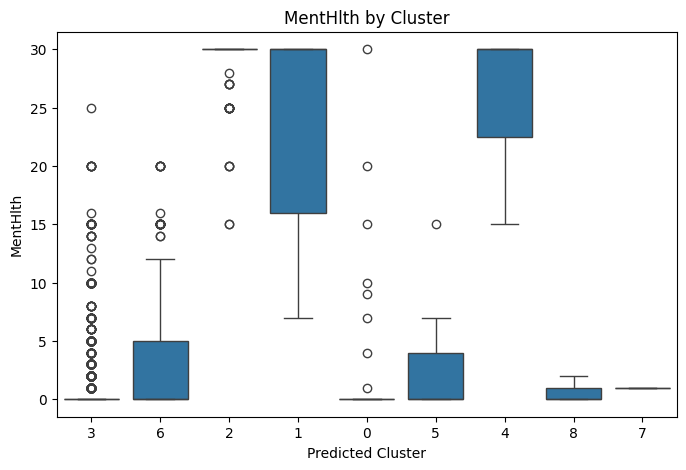

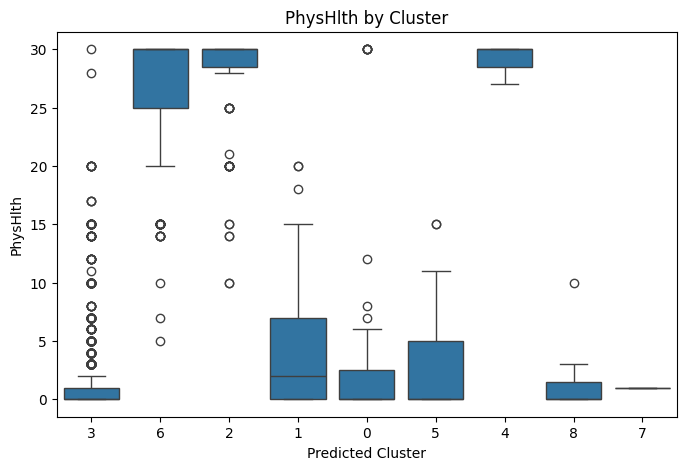

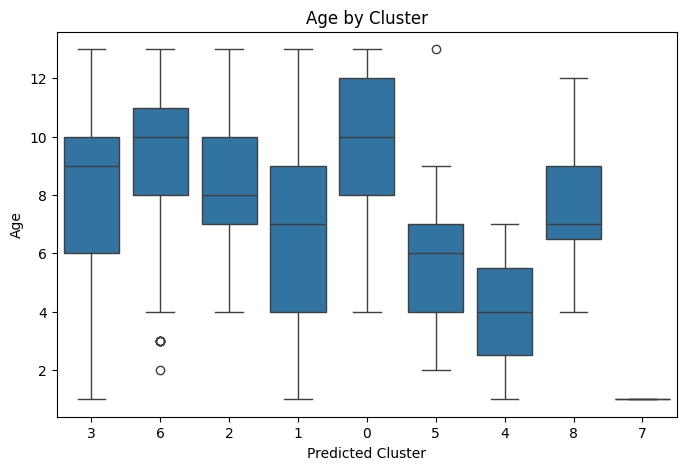

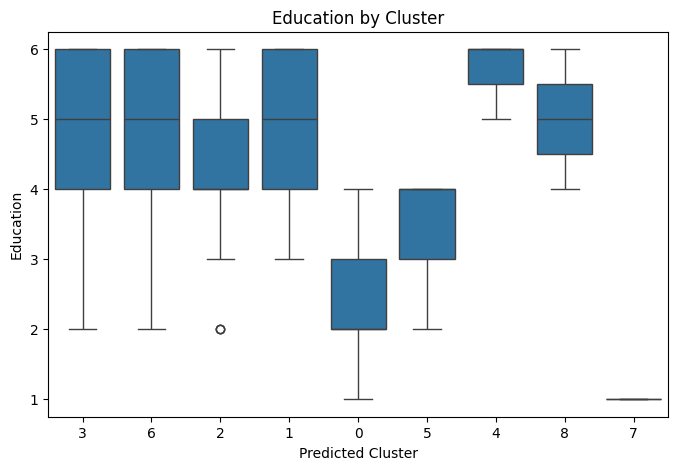

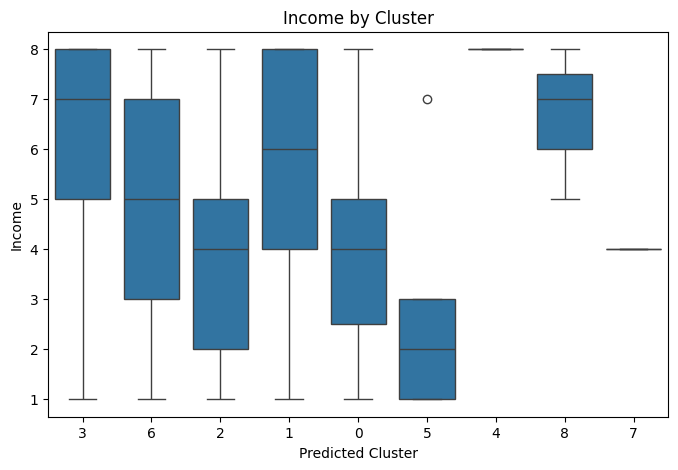

In [ ]:
for col in numerical_cols:

    plt.figure(figsize=(8,5))

    sns.boxplot(
        x=sample_with_diabetes_combo['hac_clusters'],
        y=df_sample[col]   # raw / unscaled values
    )

    plt.title(f'{col} by Cluster')
    plt.xlabel('Predicted Cluster')
    plt.ylabel(col)

    plt.show()

In [ ]:
sample_with_diabetes_combo.to_csv(
    'sample_with_diabetes_combo.csv',
    index=False
)

### 9.5 Technique Shortcoming

Same as the discussion in section 8.4, each of the techniques discussed previously in Section 8.4. Elbow Plot may not be appropriate here because the HAC results suggest a hierarchical and nested structure rather than a  set of fully separated groups. For the average silhouette score, it shows highest score when k=2 which is a meaningless clustering (with outlier/noise as a separate cluster). The cluster-sorted similarity matrices did not display perfect block diagonal form but in general, the diagonal is darker (higher similarity). However, since clusters were hierarchically related, some subcluster may share characteristics and show large between-cluster similarity. In contrast, our average linkage identify some outlier cluster with small size, which show an low between similarity on average.

## 10. Discussion

### 10.1 Clustering Comparison and Different Clusters

The clustering results produced by K-Prototypes and Hierarchical Agglomerative Clustering (HAC) with average linkage were substantially different, even they are using the same distance metrics. This was quantitatively confirmed using the adjusted rand index (ARI), where the ARI between two clusteriing was approximately 0.074. This value is close to zero, indicating little agreement between two clustering assignments.

The t-SNE visualizations further support this conclusion. K-Prototypes splited large cluster and produced several medium-size clusters that were distributed across multiple regions of the t-SNE space. In contrast, HAC with average linkage produced one extremely large dominant cluster, aoong with three small but highly localized clusters. These HAC clusters were more spatially compact and isolated with in t-SNE space.



In [ ]:
ari = adjusted_rand_score(
    sample_with_diabetes_combo['kprototypes_clusters'],
    sample_with_diabetes_combo['hac_clusters_9']
)

print(ari)

0.07433975608363658


In [ ]:
ari = adjusted_rand_score(
    sample_with_diabetes_combo['kprototypes_clusters'],
    sample_with_diabetes_combo['hac_clusters_7']
)

print(ari)

0.05706082705340281


In [ ]:
sample_with_diabetes_combo = pd.read_csv('sample_with_diabetes_combo.csv')

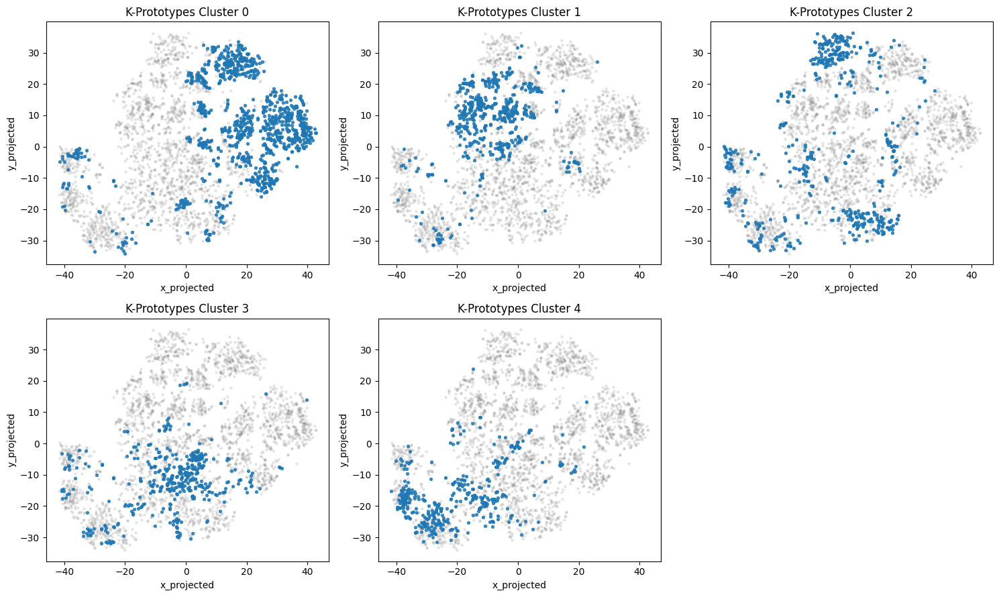

In [ ]:
clusters = sorted(sample_with_diabetes_combo['kprototypes_clusters'].unique())

fig, axes = plt.subplots(2, 3, figsize=(15, 9))
axes = axes.flatten()

for i, cluster in enumerate(clusters):

    ax = axes[i]

    # plot all points in light gray
    ax.scatter(
        sample_with_diabetes_combo['x_projected'],
        sample_with_diabetes_combo['y_projected'],
        s=5,
        alpha=0.15,
        color='gray'
    )

    # highlight one cluster
    subset = sample_with_diabetes_combo[
        sample_with_diabetes_combo['kprototypes_clusters'] == cluster
    ]

    ax.scatter(
        subset['x_projected'],
        subset['y_projected'],
        s=8,
        alpha=0.8
    )

    ax.set_title(f'K-Prototypes Cluster {cluster}')
    ax.set_xlabel('x_projected')
    ax.set_ylabel('y_projected')

# remove unused axes
for j in range(len(clusters), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

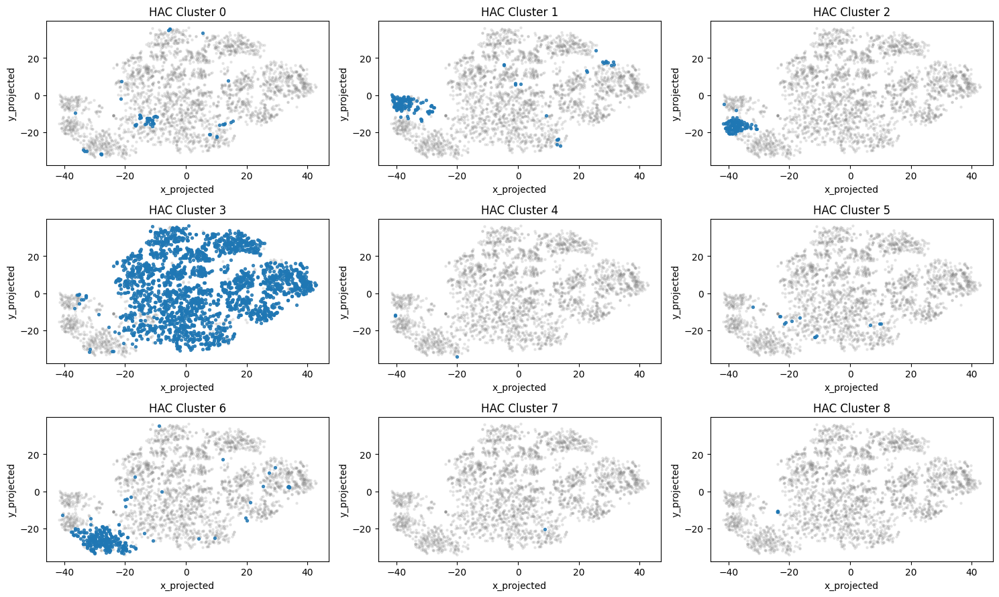

In [ ]:
clusters = sorted(sample_with_diabetes_combo['hac_clusters_9'].unique())

fig, axes = plt.subplots(3, 3, figsize=(15, 9))
axes = axes.flatten()

for i, cluster in enumerate(clusters):

    ax = axes[i]

    # plot all points in light gray
    ax.scatter(
        sample_with_diabetes_combo['x_projected'],
        sample_with_diabetes_combo['y_projected'],
        s=5,
        alpha=0.15,
        color='gray'
    )

    # highlight one cluster
    subset = sample_with_diabetes_combo[
        sample_with_diabetes_combo['hac_clusters_9'] == cluster
    ]

    ax.scatter(
        subset['x_projected'],
        subset['y_projected'],
        s=8,
        alpha=0.8
    )

    ax.set_title(f'HAC Cluster {cluster}')
    ax.set_xlabel('x_projected')
    ax.set_ylabel('y_projected')

# remove unused axes
for j in range(len(clusters), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [ ]:
sample_with_diabetes_combo['hac_clusters_9'].value_counts()

,count
hac_clusters_9,
3,2423
6,256
1,136
2,106
0,55
5,13
8,7
4,3
7,1


In [ ]:
sample_with_diabetes_combo['kprototypes_clusters'].value_counts()

,count
kprototypes_clusters,
0,1088
1,542
2,540
3,440
4,390


The clustering results produced by K-Prototypes and Hierarchical Agglomerative Clustering (HAC) with average linkage were substantially different, even they are using the same distance metrics. This was quantitatively confirmed using the adjusted rand index (ARI), where the ARI between two clusteriing was approximately 0.074. This value is close to zero, indicating little agreement between two clustering assignments.

The t-SNE visualizations further support this conclusion. K-Prototypes splited large cluster and produced several medium-size clusters that were distributed across multiple regions of the t-SNE space. In contrast, HAC with average linkage produced one extremely large dominant cluster, aoong with three small but highly localized clusters. These HAC clusters were more spatially compact and isolated with in t-SNE space.

The large differences between the K-Prototypes and HAC clustering results suggest that the dataset does not contain a single globally separable clustering structure. Instead, the data appears to contain overlapping populations, fuzzy partitions between groups, and some small localized regions of high similarity.

K-Prototypes tended to partition the dataset into broader and more evenly distributed groups, which suggests that many observations share mixed characteristics across multiple health and demographic variables. The overlap between K-Prototypes clusters in the t-SNE space also indicates that the boundaries between population groups are not sharply defined. In contrast, HAC identified several compact and localized subgroups while grouping much of the remaining data into one large cluster. This suggests that the dataset also contains smaller regions of strong local similarity embedded within a larger heterogeneous population.

We also need to consider the large number of binary categorical variables in the dataset, and the positively skewed numerical variables. These variable features likely contributed to the two different structures. How different attributes defined these clusters will be emphasis in later sections.

### 10.2 Best Clustering

In [ ]:
ari = adjusted_rand_score(
    sample_with_diabetes_combo['Diabetes_012'],
    sample_with_diabetes_combo['hac_clusters_7']
)

print(ari)

0.11336992325078346


In [ ]:
ari = adjusted_rand_score(
    sample_with_diabetes_combo['kprototypes_clusters'],
    sample_with_diabetes_combo['Diabetes_012']
)

print(ari)

0.06272042822520699


Among all clustering results explored from both K-Prototypes and HAC, the HAC clustering with average linkage provided the best clustering. Although HAC produced one dominant cluster alongside several smaller clusters, the resulting assignments closely aligned with the inherent structure suggested by the t-SNE plots. The compact regions were preserved more coherently by HAC, whereas the K-Prototypes clusters overlapped substantially and were less visually separable.

In addition, the HAC clustering was more aligned with the research goals and motivations of this project. One major objective of the analysis was to identify meaningful patient subgroups while also recognizing unusual or highly specific observations. HAC successfully isolated several small localized clusters that may represent niche patient populations or potential outlier-like groups. These smaller clusters were preserved rather than absorbed into larger generalized partitions, which supports the goal of maintaining important local structure in the dataset.

By comparison, K-Prototypes produced more balanced cluster sizes, This might suggested that the algorithm may have forced broader partitions even when the underlying structure was not strongly separated. However, the weaker alignment between K-Prototypes and the t-SNE plots does not necessarily mean that the K-Prototypes clustering was incorrect or uninformative. t-SNE is a dimensionality-reduction and visualization technique that prioritizes preservation of local neighborhood relationships rather than exact global structure. As a result, overlap in the two-dimensional embedding does not necessarily imply that meaningful separation is absent in the original higher-dimensional feature space.

### 10.3 Additional Clustering Exploration and Attribute Descriptions

All plots see corresponding Alogirthm sections (8.3 and 9.3 & 9.4)

#### 10.3.1 Clustering 1: K-prototype with gamma = 10 and k =5

The K-Prototypes clustering produced five clusters with moderately balanced sizes. Cluster 0 was the largest cluster with 1088 observations, followed by Cluster 1 (542 observations), Cluster 2 (540 observations), Cluster 3 (440 observations), and Cluster 4 as the smallest cluster with 390 observations. Although the cluster sizes were not perfectly balanced, each cluster still contained a substantial number of observations and no separate cluster for noise and outliers.

The similarity matrix showed varying levels of separation between clusters. Cluster 4 appeared to be the most distinct cluster, with large distances from the other clusters, especially Cluster 0 (60.82) and Cluster 2 (55.95). In contrast, Clusters 0, 1, and 2 were relatively closer to one another, suggesting some overlap between groups. This pattern was also reflected in the t-SNE visualizations, where several clusters occupied overlapping regions.

Clusters 0 and 1 appeared to be the most dense clusters, with the smallest intra-cluster distances (23.03 and 24.80), indicating strong similarity among observations within these groups. Cluster 4 had the largest intra-cluster distance (40.23).

The distribution of the pre-cluster label, Diabetes_012, varied meaningfully across the K-Prototypes clusters. Here, Diabetes_012 = 0 indicates no diabetes, 1 indicates prediabetes, and 2 indicates diabetes. Clusters 0 and 2 appeared relatively healthier, with larger proportions of individuals without diabetes, while Clusters 1, 3, and especially Cluster 4 showed progressively higher proportions of prediabetes and diabetes observations. This suggests that the k-prototype clustering captured some meaningful clusters in diabetes-related health risk. Next, we examine the attribute distributions within each cluster to better understand the characteristics that define these subgroup patterns.

Clusters 0 and 2 generally represented healthier subgroups. Both clusters showed low rates of high blood pressure and high cholesterol, lower levels of difficulty walking, and relatively better physical and general health outcomes. However, Cluster 0 appeared to be the healthiest overall, with the lowest smoking prevalence, high physical activity, younger age, higher education and income levels, and the lowest estimated diabetes risk. Cluster 2 remained relatively healthy but showed slightly higher smoking prevalence. In addition, Cluster 0 is dominant by female whereas Cluster 2 is dominant by male.

In contrast, Clusters 1, 3, and 4 shared several higher-risk characteristics. All three clusters had high proportions of high blood pressure and high cholesterol, indicating elevated cardiometabolic risk. These clusters also contained a higher proportion of males compared to Clusters 0 and 2. However, the clusters differed in several ways. Cluster 1 was strongly associated with smoking behavior and contained a younger, more educated, and higher-income population. Cluster 3 appeared older on average and had lower smoking prevalence, suggesting that age-related health risk may play a larger role in this subgroup. Cluster 4 represented the most severe health-risk profile overall, combining high rates of smoking, poor physical and mental health, low physical activity, and very high difficulty walking.

#### 10.3.2 Clustering 2: HAC with average linkage

When HAC was set to k=3, the clustering produced one very large cluster (Cluster 0, n=2884), one moderate-sized cluster (Cluster 2, n=109), and one extremely small cluster (Cluster 1, n=7). Cluster 1 had the smallest intra-cluster distance (29.50) and was very far from the other clusters (distance >75), suggesting a very compact but highly unusual group that likely reflects outliers rather than a stable subgroup. Cluster 2 appeared more reasonable, with moderate within-cluster distance (40.02) and separation from Cluster 0 (45.82), suggesting it may capture a meaningful subgroup within the dataset.

Cluster 1 contained no individuals with prediabetes or diabetes, but because the cluster only included 7 observations, it likely reflects a small set of unusual healthy outliers. Cluster 2 showed the highest proportion of diabetes and prediabetes cases, suggesting it captures a higher-risk subgroup with more concerning health characteristics. Cluster 0, which represented most observations, showed an intermediate distribution and reflected the broader general population.

Cluster 1 appeared to be a relatively healthy but highest-BMI group. In the categorical variables, this cluster had the low proportions of high blood pressure, high cholesterol, smoking, and difficulty walking, while maintaining moderate physical activity levels. This suggests a "small" group that may be overweight but otherwise relatively healthy.

Cluster 2 represented the highest-risk subgroup. It had the highest proportions of high blood pressure, high cholesterol, smoking, and difficulty walking, together with the lowest physical activity levels. In the numerical plots, this cluster also showed worse general health, higher physical and mental health burden, and lower income levels.

Cluster 0 represented a more moderate or mixed population. Its categorical risk factors generally fell between Clusters 1 and 2, and the numerical variables also showed intermediatelevels.

When the HAC solution increased to k=7, the original large Cluster 0 was further divided into a new Cluster 0 and Cluster 2. The new Cluster 2 (106 observations) emerged as a smaller but more vulnerable subgroup with a relatively high proportion of diabetes cases. Compared with the new Cluster 0, Cluster 2 showed higher rates of categorical risk factors such as high blood pressure, high cholesterol, smoking, and difficulty walking. It also had worse general health, physical health, and mental health outcomes, along with lower income levels.

When the HAC increased to k=9, the previous Cluster 0 from the k=7 was further divided into the new Cluster 3 (2423 observations) and Cluster 1 (136 observations). The two clusters showed similar diabetes distributions and broadly similar categorical health profiles. However, Cluster 1 had a higher proportion of smokers and showed worse mental and physical health outcomes compared with Cluster 3.

## 11. Conclusion

In this project, we explored a diabetes dataset that contains the original diabetes labels and patients’ other numerical and categorical variables that may or may not be related to diabetes. We applied the K-Prototypes clustering algorithm and the HAC with average linkage clustering algorithm. After parameter tuning, we successfully identified inherent clusters that display structural differences significant enough for us to determine which clusters can be regarded as having a higher risk of developing diabetes. This project demonstrates the usefulness of unsupervised clustering methods at revealing meaningful patterns in diabetes-related health data, even though the resulting clusters do not perfectly separate diabetes labels.

We are confident that our project results meet our research goals. Healthcare professionals can use our findings as references when determining a patient’s likelihood of having diabetes or when taking preventative diagnostic measures based on an individual’s scores in HighBP, Income, HighChol, and other variables used in our analyses. If an individual’s attribute scores are similar to those of individuals in a specific cluster, then this individual’s risk of having or developing diabetes may also be similar to that cluster’s risk.
However, none of our clusterings produced clusters that contain only one specific diabetes label. This means that even if an individual’s attribute measurements belong to a specific cluster, we cannot be completely certain about our prediction. Therefore, our prediction results are not fully reliable. They only provide suggestions and references.

For future work, we can implement more diverse clustering algorithms to explore whether they can produce better results. For example, some clusters may contain a higher proportion of healthy individuals, while other clusters may contain a higher proportion of individuals with severe diabetes. In addition, we can try more sets of parameters, which may improve our model performance.
Overall, our analyses are thorough and complete.

## References

Centers for Disease Control and Prevention. “National Diabetes Statistics Report.” 2023. https://www.cdc.gov/diabetes/php/data-research/index.html

